In [2]:
library(Seurat)
library(Matrix)
library(useful)
library(harmony)
library(dplyr)
library(sva)
library(RColorBrewer)
library(Scillus)
library(ggrepel)
library(stringr)
library(ggpubr)
library(fgsea)

set.seed(1234)

### 1. Load in complete normal kidney + tumor samples Seurat object, then subset, reproject, and recluster non-immune cells from all samples

In [2]:
seur = readRDS("Manuscript_Objects/NormalKidney_CrelessTumor_SeuratObject.RDS")

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



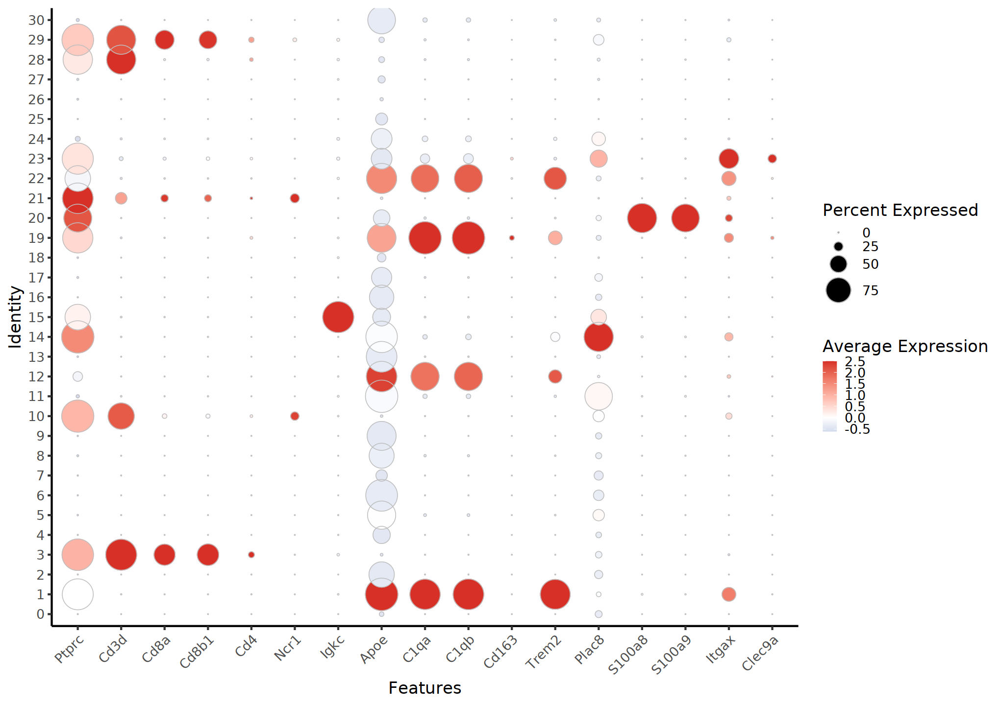

In [3]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur, features = c("Ptprc","Cd3d","Cd8a","Cd8b1","Cd4","Ncr1","Igkc","Apoe","C1qa","C1qb","Cd163","Trem2","Plac8","S100a8","S100a9","Itgax","Clec9a"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [4]:
immune = c(1, 3, 10, 12, 14, 15,19,20,21,22,23,28,29)

### We saw minimal effect from sex, so for immune cells we run harmony using sample as a covariate to identify shared states across normal kidney and tumor specimens

Centering and scaling data matrix

PC_ 1 
Positive:  Lyz2, Apoe, Ctss, Ctsb, Ctsz, Lgmn, Ftl1, Grn, Psap, C1qb 
	   C1qc, Cst3, C1qa, Csf1r, Cd68, Hexb, Tyrobp, Lamp1, Ctsh, Fcer1g 
	   Mpeg1, Trem2, Mafb, Trf, Hexa, Itgb5, Fth1, Fcgr3, Cd63, Aif1 
Negative:  Ms4a4b, Ltb, Gimap4, Gimap3, Trbc2, Cd3g, Cd3d, Nkg7, Cd3e, Sept1 
	   Trac, Skap1, Thy1, Ctsw, Ccl5, Ccnd2, Bcl2, Gimap7, Cxcr6, Lat 
	   Il2rb, Bcl11b, S100a10, Trbc1, Dusp2, Cd226, Inpp4b, Txk, Cxcr3, Klrd1 
PC_ 2 
Positive:  Top2a, Mki67, Nusap1, Birc5, Pclaf, Stmn1, Spc24, Kif11, Ccna2, Cenpf 
	   Cdk1, Prc1, Cdca3, Tpx2, Knl1, Hmmr, Rrm2, Cdca8, Esco2, Ube2c 
	   Spc25, Cenpe, Pbk, Ckap2l, Hist1h1b, Kif15, Hist1h3c, Tk1, Cks1b, Sgo2a 
Negative:  Lst1, Hp, Il1b, Cd300a, Csf3r, Fgr, Msrb1, Cebpb, S100a8, Cd300ld 
	   Ifitm6, Gsr, Gda, S100a9, Ifitm2, Gpr141, Clec4a3, Cxcr2, Ifitm3, Pla2g7 
	   Tnfaip2, Ccl6, Ace, Igsf6, Slpi, Clec4a1, Emilin2, Nr4a1, Adgre4, Tyrobp 
PC_ 3 
Positive:  Aldob, Gsr, Fxyd2, Hp, Gda, Chpt1, Gpx3, Ri

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 26206
Number of edges: 982512

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9341
Number of communities: 21
Elapsed time: 9 seconds


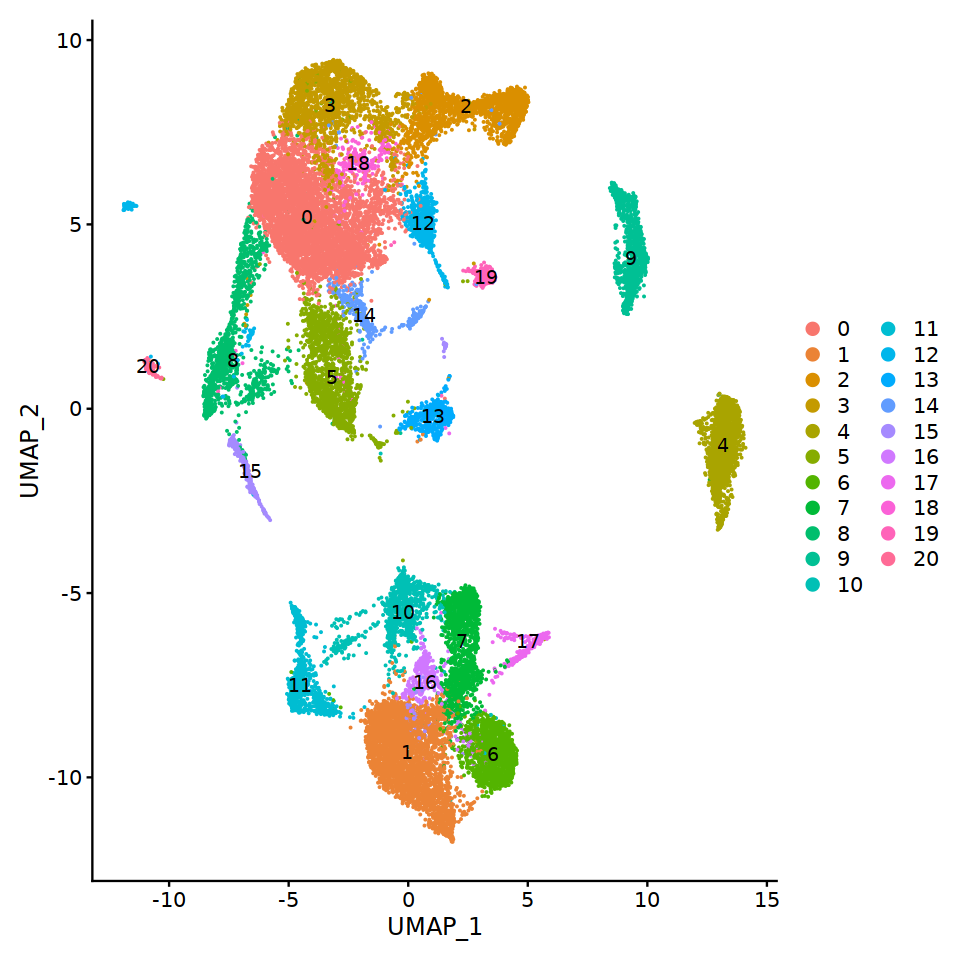

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
seur$Annot1 = Idents(seur)
seur_i = subset(seur, idents = immune)
seur_i <- NormalizeData(seur_i)
seur_i <- FindVariableFeatures(seur_i, selection.method = "vst",nfeatures = 3000)
seur_i <- ScaleData(seur_i, features = row.names(seur_i))
seur_i <- RunPCA(seur_i, npcs = 30,verbose = T)
seur_i <- RunHarmony(seur_i, group.by.vars = "Sample")
seur_i <- RunUMAP(seur_i, reduction = "harmony", dims = 1:30)
seur_i <- FindNeighbors(seur_i, reduction = "harmony", dims = 1:30)
seur_i <- FindClusters(seur_i, resolution = 0.5)
DimPlot(seur_i, label = T)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 26206
Number of edges: 982512

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9270
Number of communities: 24
Elapsed time: 8 seconds


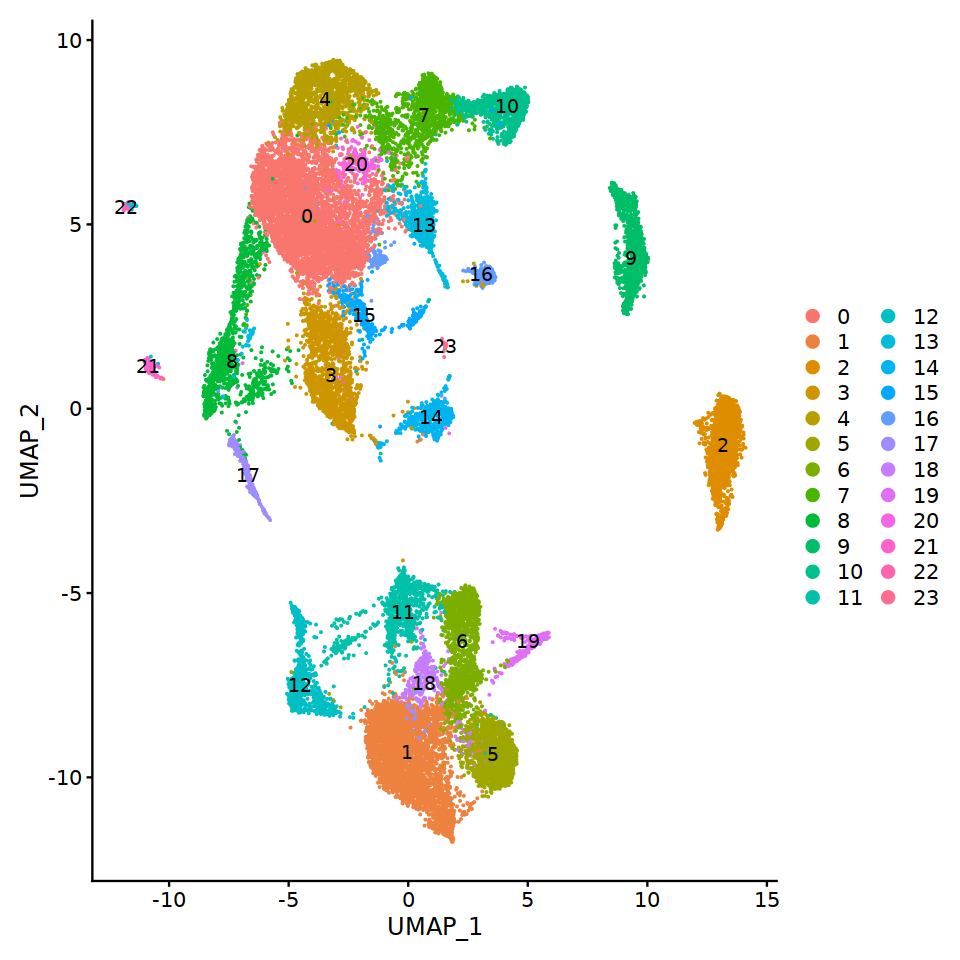

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
seur_i <- FindClusters(seur_i, resolution = 0.6)
DimPlot(seur_i, label = T)

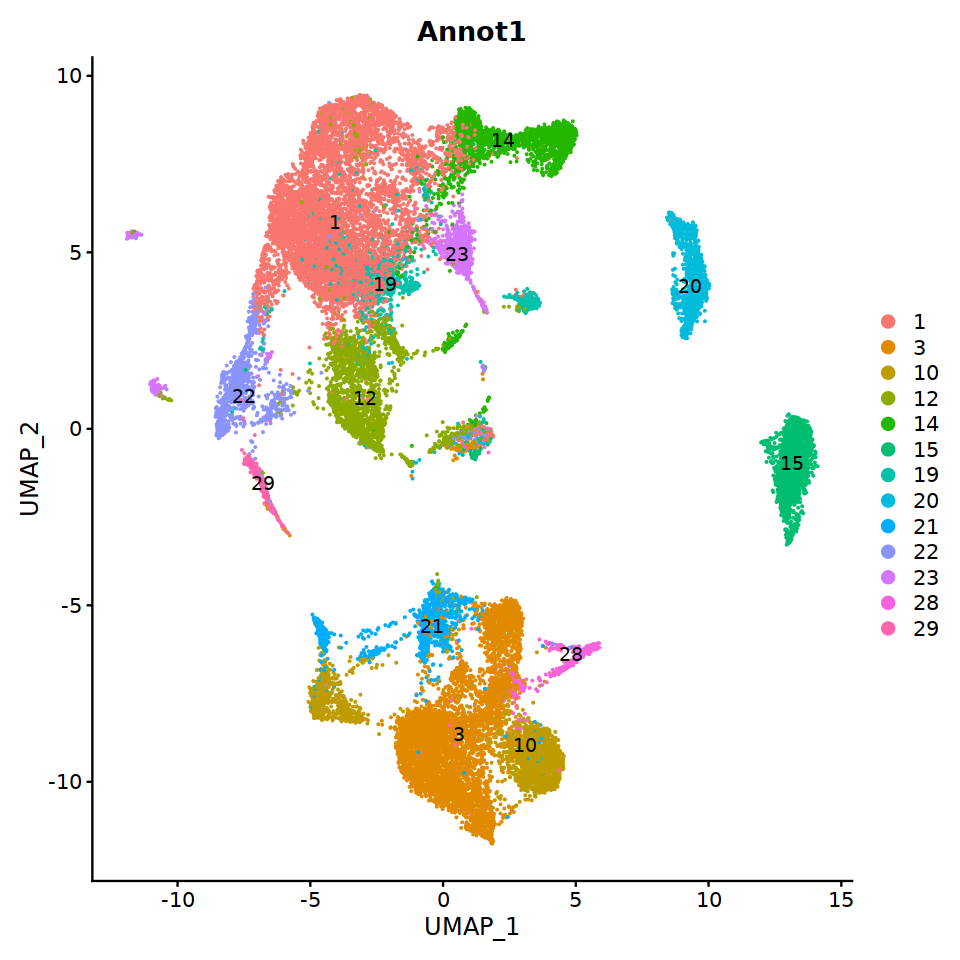

In [7]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seur_i, label = T, group.by = "Annot1")

In [8]:
saveRDS(seur_i, file = "Manuscript_Objects/Immune_SeuratObject.RDS")

In [9]:
seur_i.downsample <- subset(seur_i, downsample = 1000)

markers <- FindAllMarkers(seur_i.downsample, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")

saveRDS(markers, file = "Manuscript_Objects/Immune_FindAllMarkers_LR_Sample.RDS")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities n

In [10]:
markers = readRDS("Manuscript_Objects/Immune_FindAllMarkers_LR_Sample.RDS")

In [11]:
markers %>%
    group_by(cluster) %>%
    top_n(n = 5, wt = avg_log2FC) -> top5

top5

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,2.319024,0.978,0.534,0.000000e+00,0,Apoe
0.000000e+00,2.257240,0.984,0.389,0.000000e+00,0,Hexb
0.000000e+00,2.122685,0.989,0.307,0.000000e+00,0,C1qb
0.000000e+00,2.110122,0.981,0.297,0.000000e+00,0,C1qa
0.000000e+00,2.088321,0.985,0.283,0.000000e+00,0,C1qc
0.000000e+00,3.381570,0.979,0.273,0.000000e+00,1,Ccl5
0.000000e+00,2.571093,0.784,0.084,0.000000e+00,1,Cd8b1
0.000000e+00,2.412408,0.984,0.251,0.000000e+00,1,Nkg7
0.000000e+00,2.213759,0.792,0.083,0.000000e+00,1,Cd8a


In [12]:
seur_i = readRDS(file = "Manuscript_Objects/Immune_SeuratObject.RDS")

In [13]:
table(seur_i$seurat_clusters)
table(seur_i$Sample)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
4987 3373 1815 1599 1482 1469 1391 1234 1191 1086 1024  962  896  782  541  440 
  16   17   18   19   20   21   22   23 
 369  368  356  306  256  157   83   39 


  10_VX516_N  11_VX5256_T  12_VX5256_N    3_BB453_T 5_BB452_KR_N 6_BB452_KL_T 
         736         8953         1459         4174          566         7381 
   8_BB455_N    9_VX516_T 
         953         1984 

In [14]:
DefaultAssay(seur_i) = "RNA"
cluster.averages <- AverageExpression(seur_i, return.seurat = TRUE, group.by = "seurat_clusters",add.ident = "Sample")
cluster_sample = strsplit(row.names(cluster.averages@meta.data),"_")
sample = lapply(cluster_sample, function(x) x[-1])
cluster.averages$Sample = unlist(lapply(sample, paste,collapse = "_"))
cluster.averages$orig.ident = factor(cluster.averages$orig.ident, levels = c(0:24))

Warning message:
"'add.ident' is a deprecated argument, please use the 'group.by' argument instead"
Centering and scaling data matrix



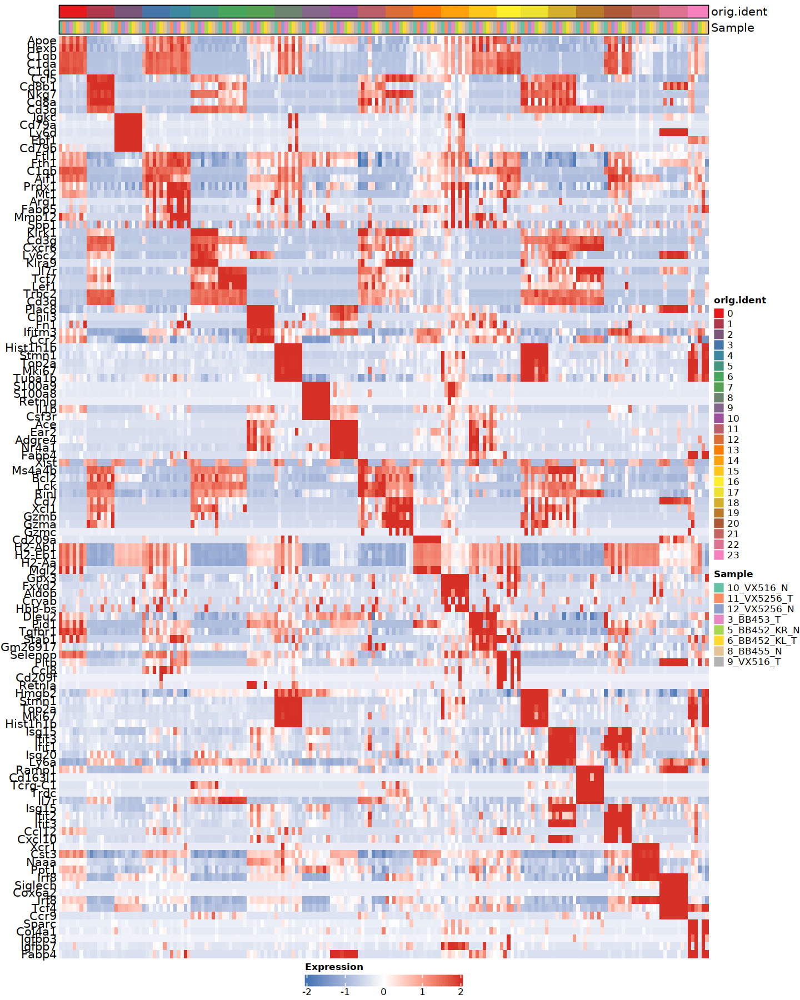

In [15]:
options(repr.plot.width=12, repr.plot.height=15)

colors <- list(colorRampPalette(brewer.pal(8, "Set1"))(24),brewer.pal(8,"Set2"))

DefaultAssay(cluster.averages) = "RNA"
plot_heatmap(dataset = cluster.averages, 
              markers = top5$gene,
              sort_var = c("orig.ident","Sample"),
              anno_var = c("orig.ident","Sample"),
              anno_colors = colors)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



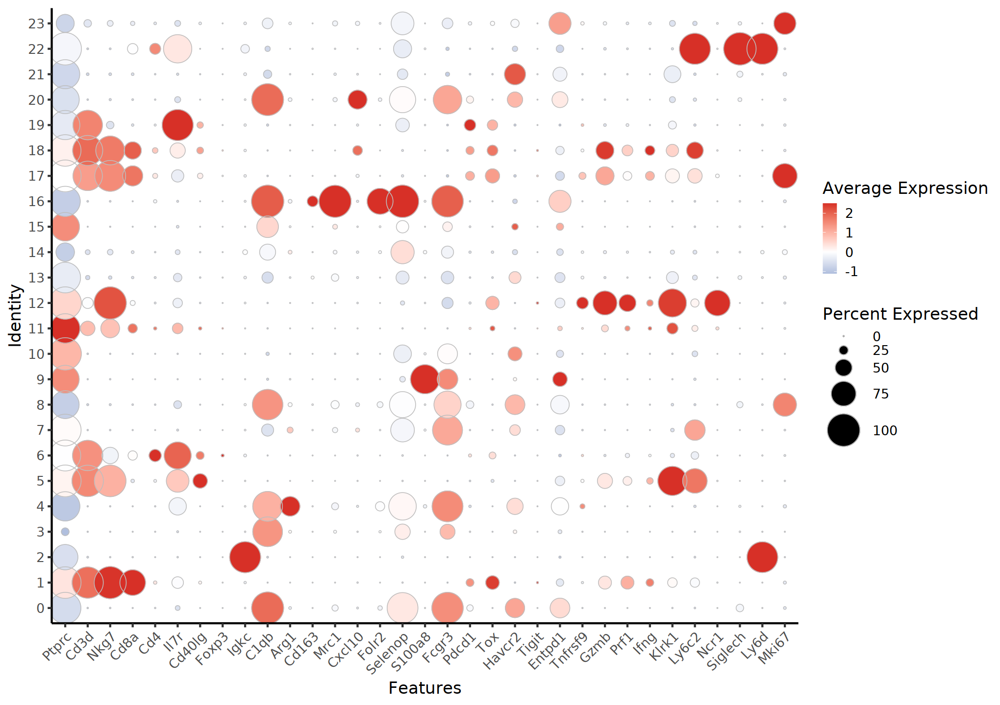

In [16]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_i, features = c("Ptprc","Cd3d","Nkg7","Cd8a","Cd4","Il7r","Cd40lg","Foxp3","Igkc","C1qb","Arg1","Cd163","Mrc1","Cxcl10","Folr2","Selenop","S100a8","Fcgr3","Pdcd1","Tox","Havcr2","Tigit","Entpd1","Tnfrsf9","Gzmb","Prf1","Ifng","Klrk1","Ly6c2","Ncr1","Siglech","Ly6d","Mki67"),group.by = "seurat_clusters",assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

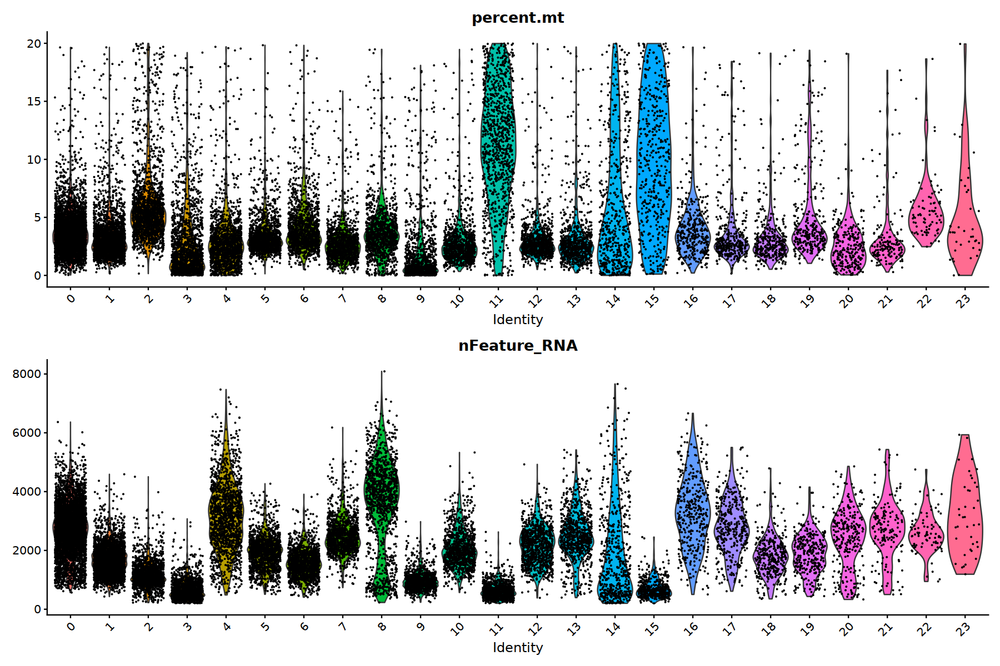

In [17]:
options(repr.plot.width=15, repr.plot.height=10)
VlnPlot(seur_i, features = c("percent.mt","nFeature_RNA"), ncol =1)

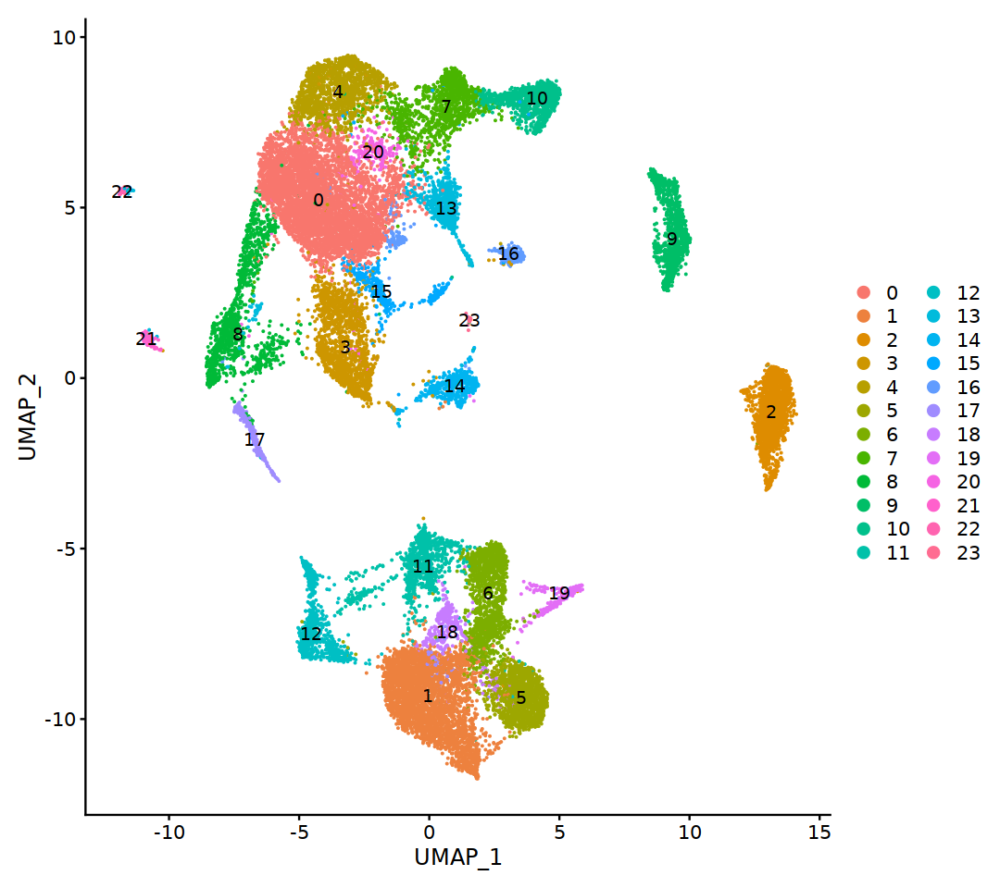

In [18]:
options(repr.plot.width=9, repr.plot.height=8)
DimPlot(seur_i, label = T)

In [19]:
#0 Macrophage_C1qa
#1 CD8_Cd8b1
#2 Plasma_cell_Igkc
#3 Macrophage_AmbientHigh_Ftl1
#4 MDSC_Arg1
#5 NKT_Klrk1
#6 Memory_TH_Il7r
#7 Monocyte_Plac8
#8 Myeloid_Cycling_Mki67
#9 Neutrophil_S100a9
#10 Monocyte_Ace
#11 MitoHigh_Lymphoid
#12 NK_Ncr1
#13 DC_209a
#14 PT_Contaminant
#15 MitoHigh_Myeloid
#16 Macrophage_Mrc1
#17 Tcell_Cycling_Mki67
#18 Tcell_ISG_High_Isg15
#19 gd_T_cell
#20 Macrophage_ISG_High_Isg15
#21 DC_Xcr1
#22 pDC_Siglech
#23 Stromal_Contaminant

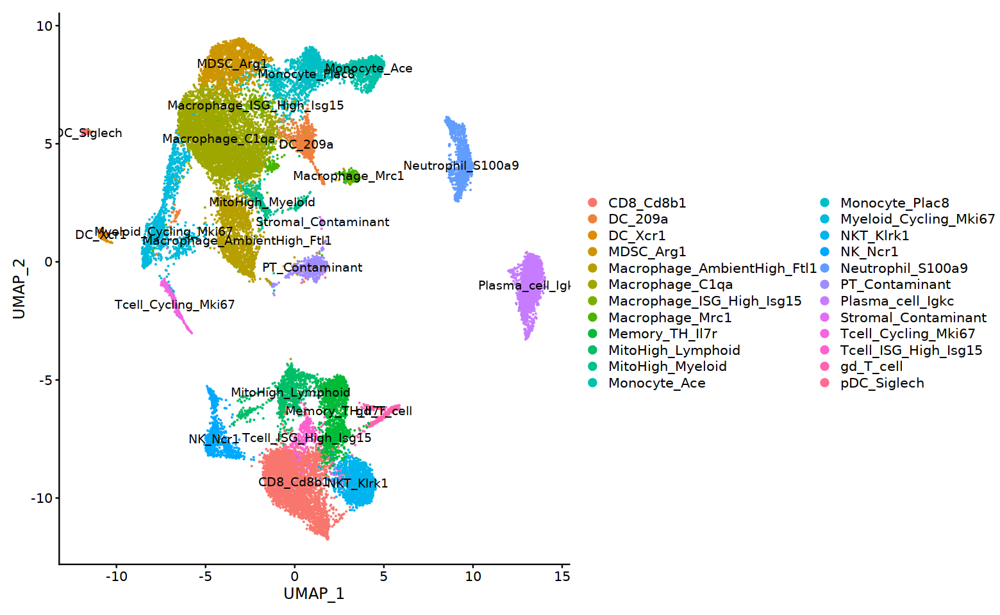

In [20]:
Idents(seur_i) = "seurat_clusters"

new.cluster.ids = c("Macrophage_C1qa","CD8_Cd8b1","Plasma_cell_Igkc","Macrophage_AmbientHigh_Ftl1","MDSC_Arg1","NKT_Klrk1","Memory_TH_Il7r","Monocyte_Plac8","Myeloid_Cycling_Mki67","Neutrophil_S100a9","Monocyte_Ace","MitoHigh_Lymphoid","NK_Ncr1","DC_209a","PT_Contaminant","MitoHigh_Myeloid","Macrophage_Mrc1","Tcell_Cycling_Mki67","Tcell_ISG_High_Isg15","gd_T_cell","Macrophage_ISG_High_Isg15","DC_Xcr1","pDC_Siglech","Stromal_Contaminant")
names(new.cluster.ids) = levels(seur_i)
seur_i = RenameIdents(seur_i, new.cluster.ids)

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

In [21]:
seur_i$Annot_Imm_1 = Idents(seur_i)

In [22]:
saveRDS(seur_i, file = "Manuscript_Objects/Immune_SeuratObject.RDS")

### 2. Subset, reproject, and recluster cycling clusters and T_cell_ISG_High cluster to identify granular cell types 

In [23]:
seur_i = readRDS("Manuscript_Objects/Immune_SeuratObject.RDS")

In [24]:
Idents(seur_i) = "Annot_Imm_1"

Centering and scaling data matrix

PC_ 1 
Positive:  Top2a, Mki67, Prc1, Nusap1, Knl1, Cenpf, H2afx, Hist1h1b, Kif11, Hist1h2ae 
	   Birc5, Hjurp, Tpx2, Ccna2, Kif15, Cdca3, Hist1h3c, Kif23, Cdca8, Smc4 
	   Fbxo5, Tubb5, Hist1h2ap, Hist2h2ac, Ube2s, Esco2, Hmmr, Hist1h1e, Incenp, Hist1h4d 
Negative:  Rps18, Npm1, Rps2, Nme1, Rps27a, Rpl13, Nme2, Ppp1r14b, Hsp90ab1, Hspe1 
	   Rpl32, Rpl36a, Rps12, Rplp0, Rpl15, Atp5g1, Mif, Rps26, Rpl41, Rpl7a 
	   C1qbp, Rps20, Ccnd2, Rpl31, Rpl23a, Rps17, Uqcc2, Rps25, Ung, Cdca7 
PC_ 2 
Positive:  Tsix, Xist, mt-Nd4, Chd6, Bcl2, Gm20559, Itga1, mt-Nd1, Cd5, mt-Nd2 
	   Itgb1, AY036118, Dleu2, Hbb-bs, Kcnq1ot1, Itga4, Trim56, Cd8a, Tasor2, Cd6 
	   Gm15472, Cdh1, Atp2b4, Zfp652, Gzmk, Vmn2r97, Trip11, Dst, Nedd9, Dusp2 
Negative:  Rpl41, Rpl28, Rps25, Rps17, Gapdh, Rps26, Rps27a, Ptma, Rpl32, Txn1 
	   Rps20, Rplp0, Rpl15, Rps12, Prdx1, Pfn1, Rps2, Rpl13, Snrpd1, Rpl31 
	   Rps27l, Dbi, Actg1, Rpl7a, Set, Eif5a, H2afz, Nme2, Rpl23a, Snrpd2 
PC_ 3 
P

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 368
Number of edges: 11693

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8002
Number of communities: 3
Elapsed time: 0 seconds


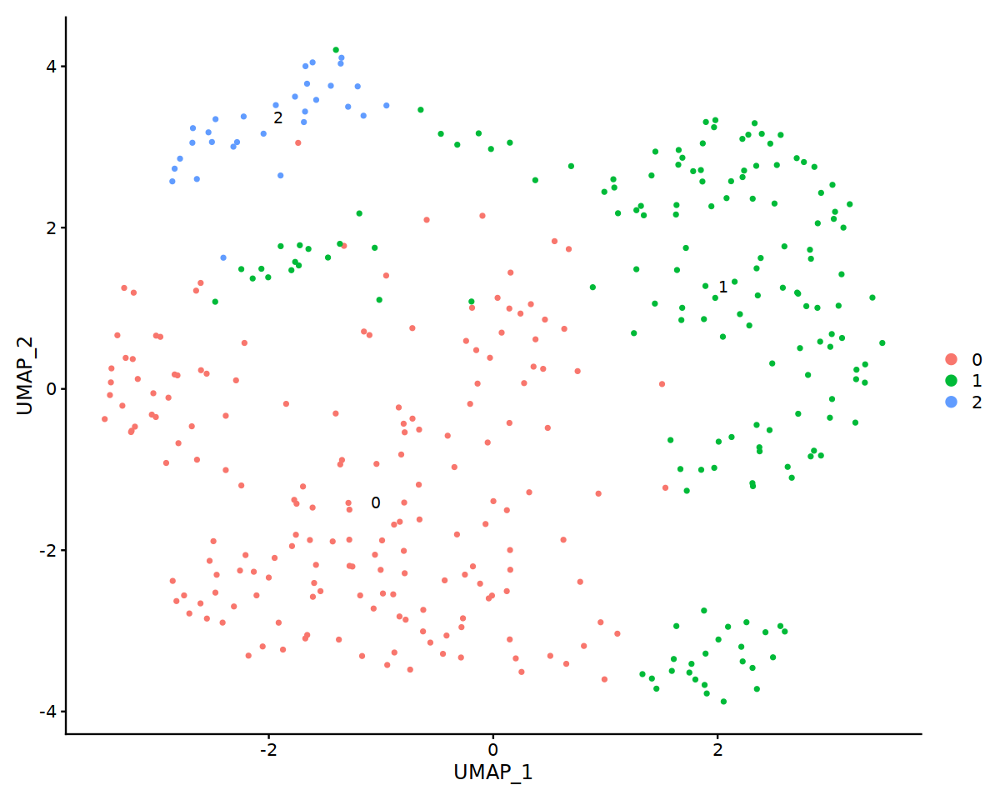

In [25]:
options(repr.plot.width=10, repr.plot.height=8)

seur_t_cyc = subset(seur_i, idents = "Tcell_Cycling_Mki67")
seur_t_cyc <- NormalizeData(seur_t_cyc)
seur_t_cyc <- FindVariableFeatures(seur_t_cyc, selection.method = "vst",nfeatures = 3000)
seur_t_cyc <- ScaleData(seur_t_cyc, features = row.names(seur_t_cyc))
seur_t_cyc <- RunPCA(seur_t_cyc, npcs = 30,verbose = T)
seur_t_cyc <- RunHarmony(seur_t_cyc, group.by.vars = "Sample")
seur_t_cyc <- RunUMAP(seur_t_cyc, reduction = "harmony", dims = 1:10)
seur_t_cyc <- FindNeighbors(seur_t_cyc, reduction = "harmony", dims = 1:10)
seur_t_cyc <- FindClusters(seur_t_cyc, resolution = 0.3)
DimPlot(seur_t_cyc, label = T)

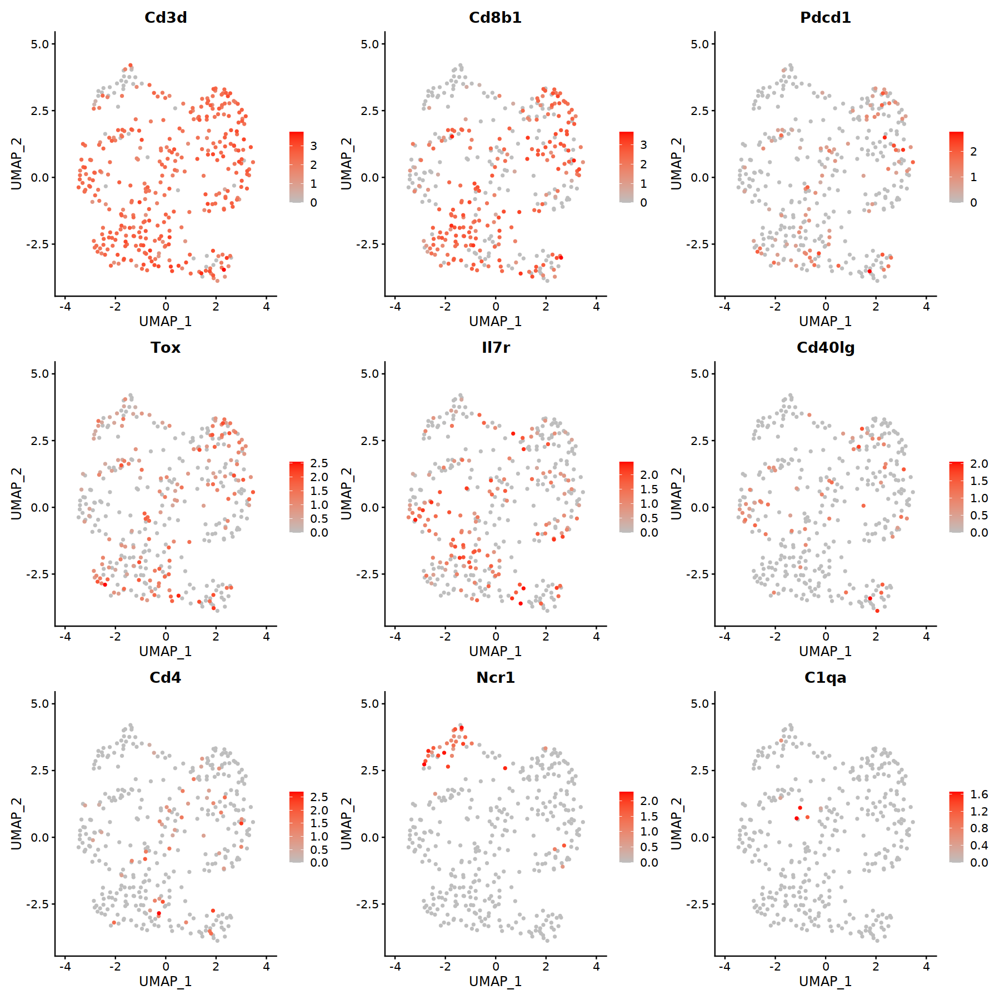

In [26]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_t_cyc, c("Cd3d","Cd8b1","Pdcd1","Tox","Il7r","Cd40lg","Cd4","Ncr1","C1qa"),order = T,cols = c("grey","red"))


In [27]:
markers_t_cyc <- FindAllMarkers(seur_t_cyc, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",test.use = "LR",latent.vars = "Sample")
markers_t_cyc %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"


p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.843444e-21,0.7018999,0.994,0.974,6.787586e-17,0,Rps18
4.253118e-20,0.7634182,0.994,0.942,1.015262e-15,0,Rpl12
5.150919e-20,0.7504164,0.989,0.895,1.229576e-15,0,Npm1
1.356121e-19,0.7174515,1.000,0.953,3.237196e-15,0,Rps2
3.895303e-16,0.9077761,0.938,0.784,9.298477e-12,0,Hspe1
4.779406e-15,0.7887542,0.933,0.847,1.140892e-10,0,Nme2
3.800842e-12,0.8544583,0.871,0.711,9.072989e-08,0,Ccnd2
3.470551e-11,0.7738606,0.904,0.732,8.284552e-07,0,Mif
2.427045e-10,0.7548656,0.966,0.889,5.793600e-06,0,S100a6


In [28]:
#0 CD8_Cycling
#1 CD8_Cycling
#2 NK_Cycling

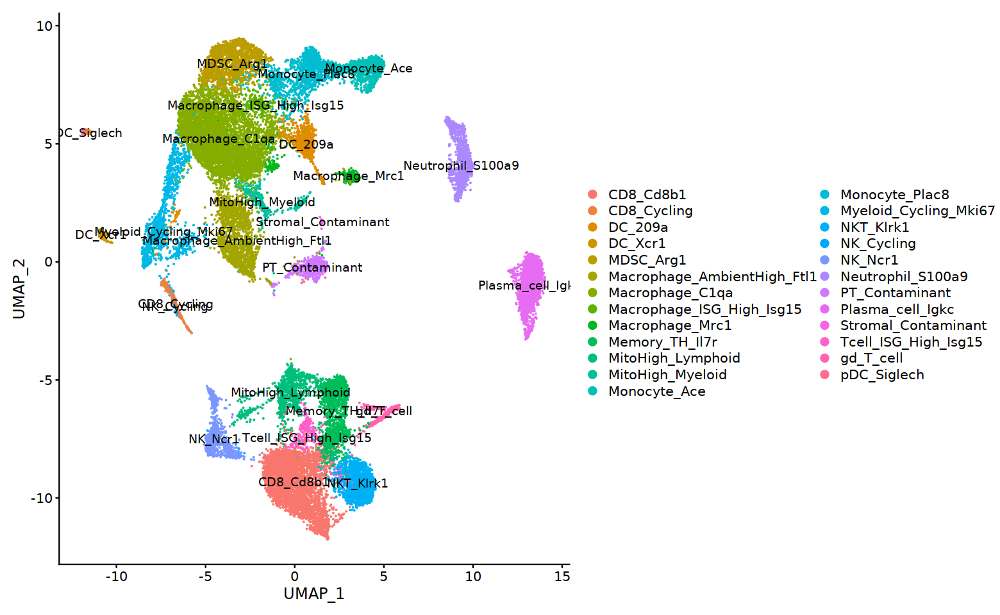

In [29]:
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_cyc@meta.data, seurat_clusters == 0)),value = "CD8_Cycling")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_cyc@meta.data, seurat_clusters == 1)),value = "CD8_Cycling")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_cyc@meta.data, seurat_clusters == 2)),value = "NK_Cycling")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  AY036118, Hbb-bs, Cryab, Hba-a1, Gm42418, Spp1, Hba-a2, Gsta2, H2-Eb1, Cd74 
	   Ptprcap, Gimap1, H2-Aa, Prdx1, Rida, Ltb, Tmsb10, Aldob, Igkc, Hbb-bt 
	   Ly6d, Gcsam, H2-Ab1, AW112010, Hspb1, Cd79a, Ighm, Phf11b, Mzb1, Fcmr 
Negative:  Hsp90b1, Psap, App, Ctsb, Zeb2, Lrp1, Grn, Abca1, Tpp1, Slc6a6 
	   Lipa, Aplp2, Ctsa, C3ar1, Fcgr2b, Itgam, Soat1, Mki67, Klf6, Lamp1 
	   Cltc, Nrp2, Arl6ip1, Rbms1, Atp2a2, Calr, Hspa5, Lgmn, Dhrs3, Dab2 
PC_ 2 
Positive:  Apoe, Cd63, Lyz2, Ctsd, Olfml3, Cd81, Ms4a7, Fth1, Trem2, Ftl1 
	   Stab1, Tyrobp, Lgmn, Tmem119, Cx3cr1, Rnase4, Bst2, Ctsz, Basp1, Ctsb 
	   Timp2, Syngr1, Bhlhe41, Grn, Mafb, C3ar1, Ptgs1, Fcrls, Bcl2a1b, Tmem37 
Negative:  Itgb7, Napsa, Klrd1, Hmgb2, S100a11, Ciita, 4930523C07Rik, Jaml, Olfm1, S100a10 
	   Bcl11a, S100a6, Tiam1, H2afx, Cd209a, Rgs18, Rnd3, Kctd14, Top2a, Klrk1 
	   Cbfa2t3, Ahnak, Rnase6, Clec10a, Dpp4, Emb, H2-Oa, Kif23, Ltb4r1, H2afv 
PC_ 3 
Positive:  Prc

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1191
Number of edges: 37699

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9183
Number of communities: 5
Elapsed time: 0 seconds


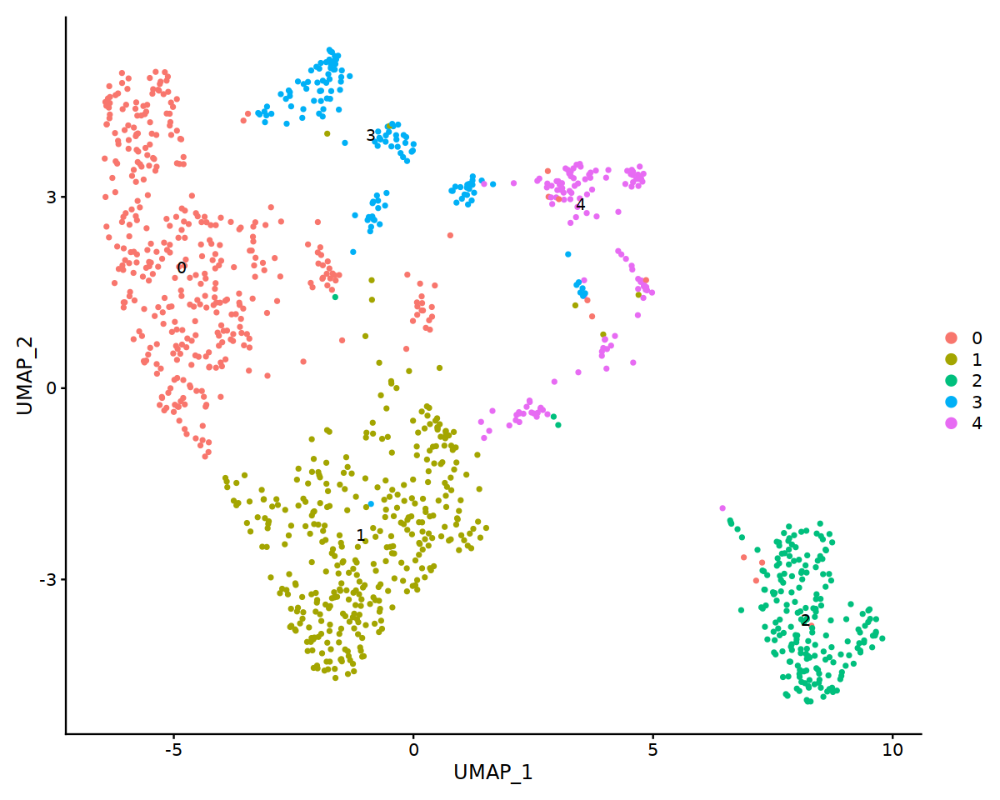

In [30]:
options(repr.plot.width=10, repr.plot.height=8)

seur_m_cyc = subset(seur_i, idents = "Myeloid_Cycling_Mki67")
seur_m_cyc <- NormalizeData(seur_m_cyc)
seur_m_cyc <- FindVariableFeatures(seur_m_cyc, selection.method = "vst",nfeatures = 3000)
seur_m_cyc <- ScaleData(seur_m_cyc, features = row.names(seur_m_cyc))
seur_m_cyc <- RunPCA(seur_m_cyc, npcs = 30,verbose = T)
seur_m_cyc <- RunHarmony(seur_m_cyc, group.by.vars = "Sample")
seur_m_cyc <- RunUMAP(seur_m_cyc, reduction = "harmony", dims = 1:10)
seur_m_cyc <- FindNeighbors(seur_m_cyc, reduction = "harmony", dims = 1:10)
seur_m_cyc <- FindClusters(seur_m_cyc, resolution = 0.2)
DimPlot(seur_m_cyc, label = T)

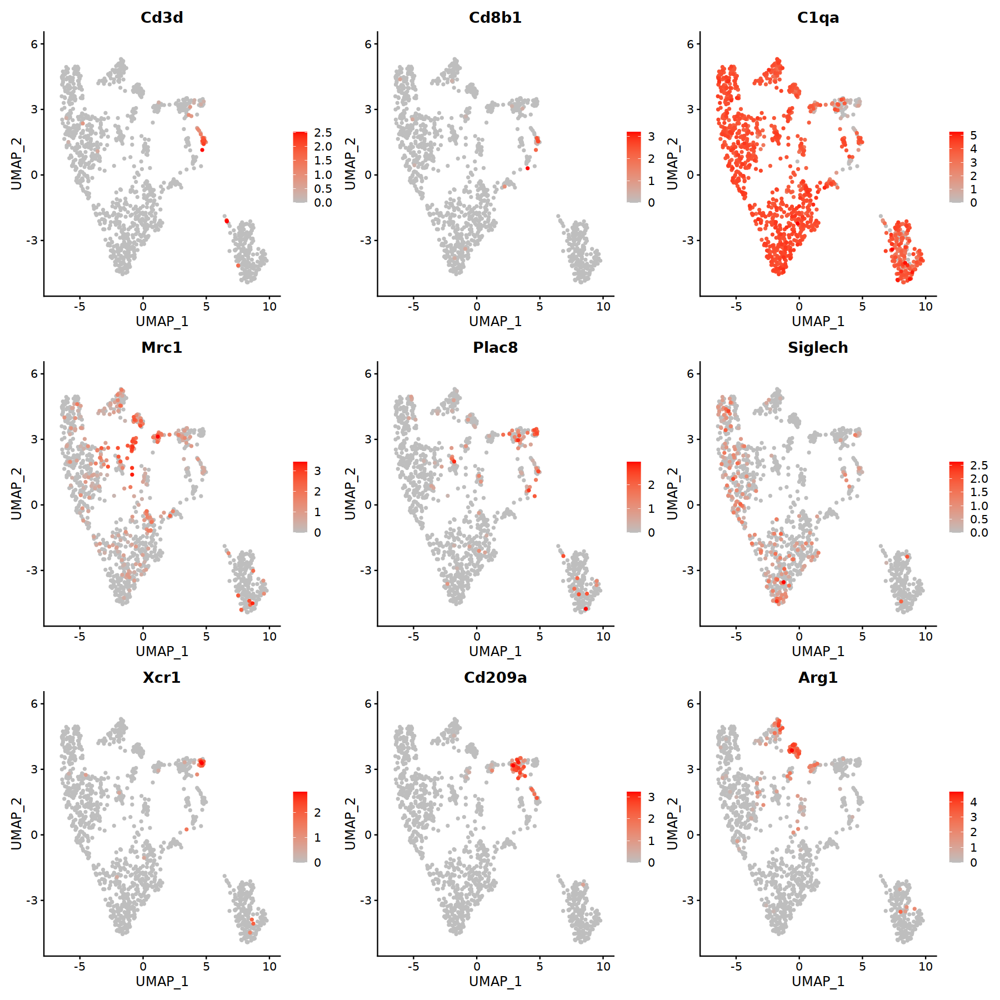

In [31]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_m_cyc, c("Cd3d","Cd8b1","C1qa","Mrc1","Plac8","Siglech","Xcr1","Cd209a","Arg1"),order = T,cols = c("grey","red"))


In [32]:
markers_m_cyc <- FindAllMarkers(seur_m_cyc, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",test.use = "LR",latent.vars = "Sample")
markers_m_cyc %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3.289284e-84,1.1997225,0.989,0.571,7.851849e-80,0,Mki67
3.007260e-77,0.9114075,0.947,0.419,7.178629e-73,0,Tpx2
8.018500e-77,0.9952356,0.892,0.273,1.914096e-72,0,Hmmr
4.113954e-69,1.1153009,0.923,0.325,9.820420e-65,0,Cenpf
2.779343e-62,0.8867968,0.910,0.417,6.634570e-58,0,Cenpe
5.313188e-61,0.9088716,0.892,0.323,1.268311e-56,0,Cenpa
1.523127e-54,0.8641290,0.995,0.840,3.635856e-50,0,Arl6ip1
1.667767e-54,0.9230993,0.892,0.443,3.981127e-50,0,Prc1
6.884178e-37,0.9729142,0.701,0.311,1.643322e-32,0,Hist1h2ap


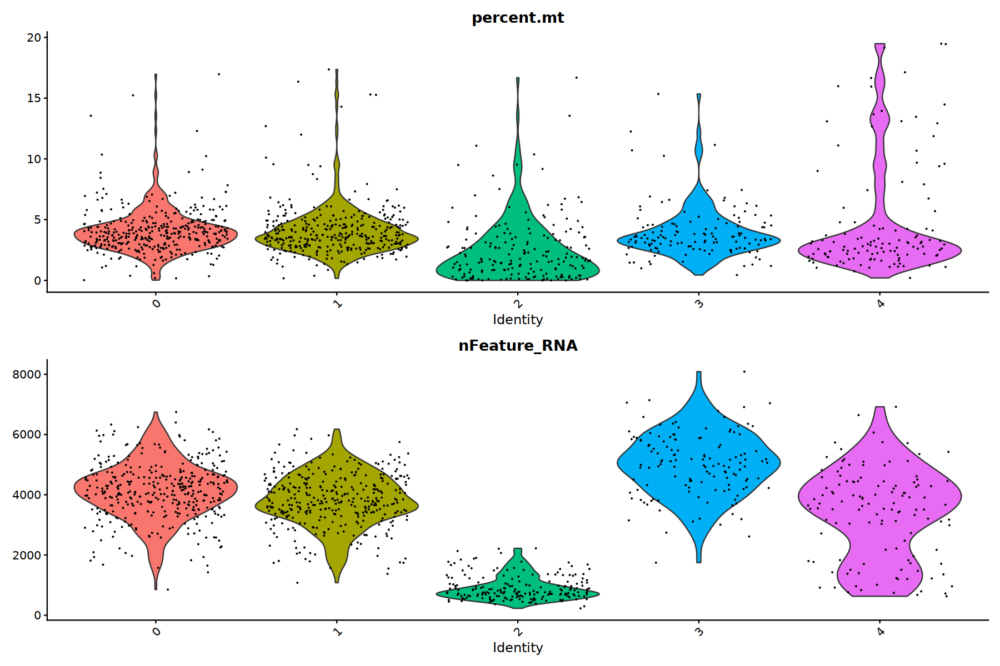

In [33]:
options(repr.plot.width=15, repr.plot.height=10)
VlnPlot(seur_m_cyc, features = c("percent.mt","nFeature_RNA"), ncol =1)

In [34]:
#0 Macrophage_Cycling
#1 Macrophage_Cycling
#2 LowLibSize_Contaminant
#3 MDSC_Cycling
#4 DC_Cycling

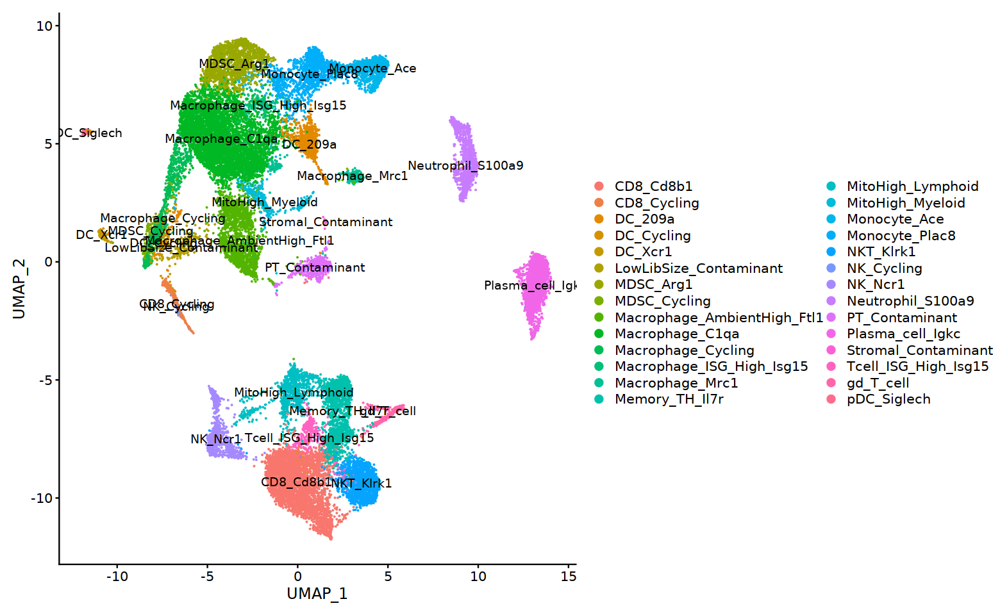

In [35]:
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_m_cyc@meta.data, seurat_clusters == 0)),value = "Macrophage_Cycling")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_m_cyc@meta.data, seurat_clusters == 1)),value = "Macrophage_Cycling")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_m_cyc@meta.data, seurat_clusters == 2)),value = "LowLibSize_Contaminant")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_m_cyc@meta.data, seurat_clusters == 3)),value = "MDSC_Cycling")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_m_cyc@meta.data, seurat_clusters == 4)),value = "DC_Cycling")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  Eef1a1, Rps7, Rpsa, Rpl32, Rpl13, Rpl23a, Rps12, Rps20, Rplp0, Rpl23 
	   Rps11, Rps18, Rps8, Rpl12, Rps2, Rpl10, Sh3bgrl3, Rpl8, Rps19, Rpl14 
	   Tmsb10, Rps5, Rps28, Cd52, Rpl28, Eef1b2, Rpl10a, Rpl36a, Ptma, Rpl35 
Negative:  Samhd1, Iigp1, Parp14, Cd86, Rsad2, Cxcl10, Smchd1, Samd9l, mt-Co3, Ifi204 
	   Mndal, Gbp7, Phip, Cmpk2, Cybb, Phf11b, Oas2, Ifit1, Usp18, Herc6 
	   Slfn5, Gbp6, Stat2, Ifit2, Setdb2, Pml, Ddx60, Nlrc5, Ifit3, Trim30c 
PC_ 2 
Positive:  Fgl2, Klra9, Klrk1, Klrc2, Satb1, Rgs2, Inpp4b, Mycbp2, Nktr, Fcer1g 
	   Rcbtb2, Klre1, Ifitm2, Psap, Etnk1, Txk, Rapgef6, Samd9l, Macf1, Dennd4a 
	   Tmem176b, Apobr, Ifitm3, AU020206, Atp8b4, Kcnj8, Itsn1, Resf1, Zfp652, Klrd1 
Negative:  Rps5, Rps11, Rpl32, Rplp0, Rps28, Rpl8, Rpl23, Rps8, Rps7, Rps18 
	   Rpl28, Rpl12, Rpsa, Rps20, Rps19, Rpl13, Rps12, Rps2, Cd8a, Rpl10a 
	   Eef1a1, Cd8b1, Ccl5, Rpl14, Rpl35, Crip1, Gzmk, Txn1, Casp1, Rpl36a 
PC_ 3 
Positive:  Lztfl1,

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 356
Number of edges: 11469

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7919
Number of communities: 3
Elapsed time: 0 seconds


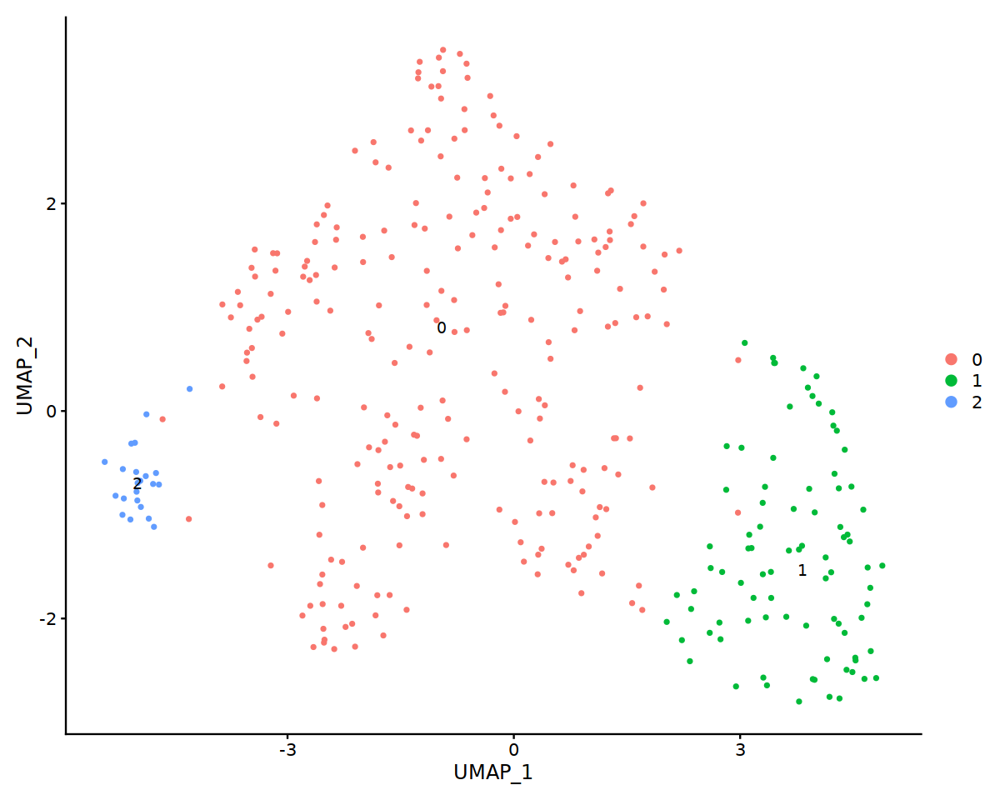

In [36]:
options(repr.plot.width=10, repr.plot.height=8)

seur_t_isg = subset(seur_i, idents = "Tcell_ISG_High_Isg15")
seur_t_isg <- NormalizeData(seur_t_isg)
seur_t_isg <- FindVariableFeatures(seur_t_isg, selection.method = "vst",nfeatures = 3000)
seur_t_isg <- ScaleData(seur_t_isg, features = row.names(seur_t_isg))
seur_t_isg <- RunPCA(seur_t_isg, npcs = 30,verbose = T)
seur_t_isg <- RunHarmony(seur_t_isg, group.by.vars = "Sample")
seur_t_isg <- RunUMAP(seur_t_isg, reduction = "harmony", dims = 1:10)
seur_t_isg <- FindNeighbors(seur_t_isg, reduction = "harmony", dims = 1:10)
seur_t_isg <- FindClusters(seur_t_isg, resolution = 0.3)
DimPlot(seur_t_isg, label = T)

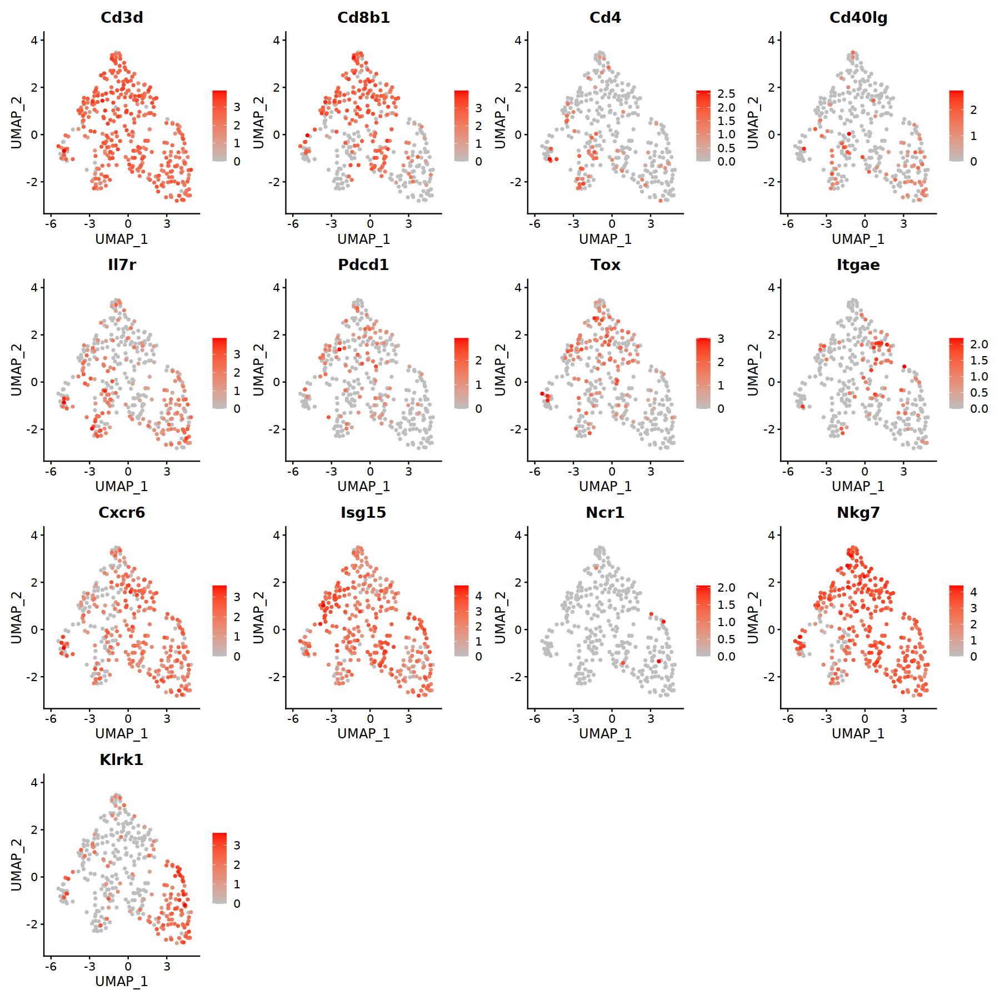

In [37]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_t_isg, c("Cd3d","Cd8b1","Cd4","Cd40lg","Il7r","Pdcd1","Tox","Itgae","Cxcr6","Isg15","Ncr1","Nkg7","Klrk1"),order = T,cols = c("grey","red"))


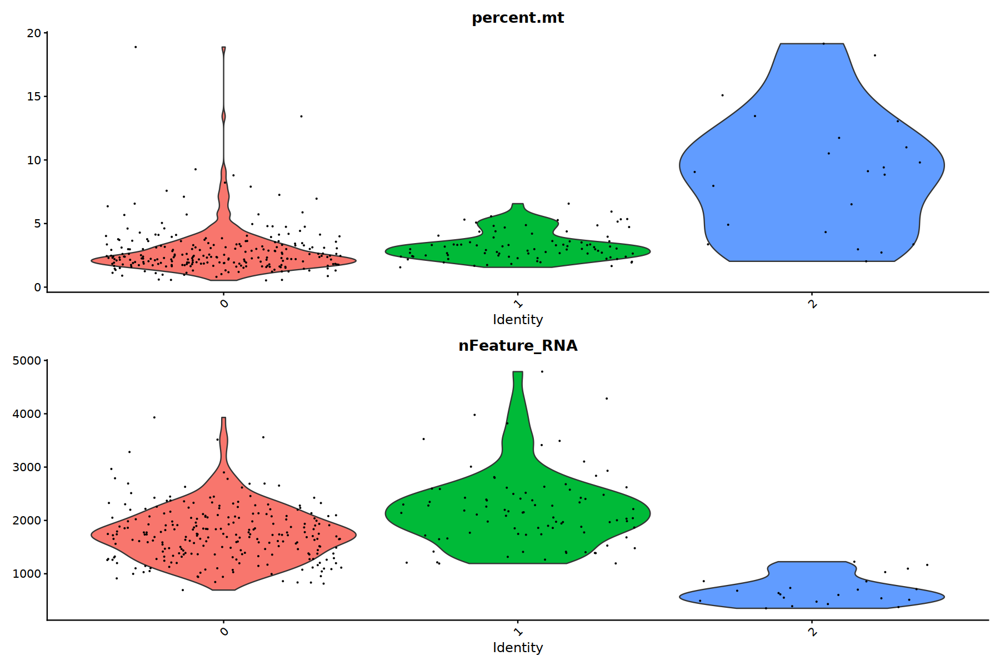

In [38]:
options(repr.plot.width=15, repr.plot.height=10)
VlnPlot(seur_t_isg, features = c("percent.mt","nFeature_RNA"), ncol =1)

In [39]:
markers_t_isg <- FindAllMarkers(seur_t_isg, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",test.use = "LR",latent.vars = "Sample")
markers_t_isg %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3.090994e-26,1.8679441,0.681,0.130,7.378511e-22,0,Cd8a
6.653183e-20,1.3020545,0.500,0.065,1.588181e-15,0,Casp1
3.709707e-18,1.6472318,0.645,0.222,8.855442e-14,0,Cd8b1
1.983436e-16,1.2899933,0.593,0.148,4.734659e-12,0,Gzmk
7.710902e-10,1.5067265,0.907,0.880,1.840669e-05,0,Ccl5
1.282054e-09,0.8412764,0.560,0.259,3.060390e-05,0,Gm8369
1.084676e-08,0.8072090,0.399,0.120,2.589230e-04,0,Emb
2.918775e-08,1.8312067,0.339,0.093,6.967407e-04,0,Ccl4
1.576607e-07,0.7932710,0.351,0.093,3.763517e-03,0,Eomes


In [40]:
#0 CD8_ISG_High_Isg15
#1 NKT_ISG_High_Isg15
#2 LowLibSize_Contaminant

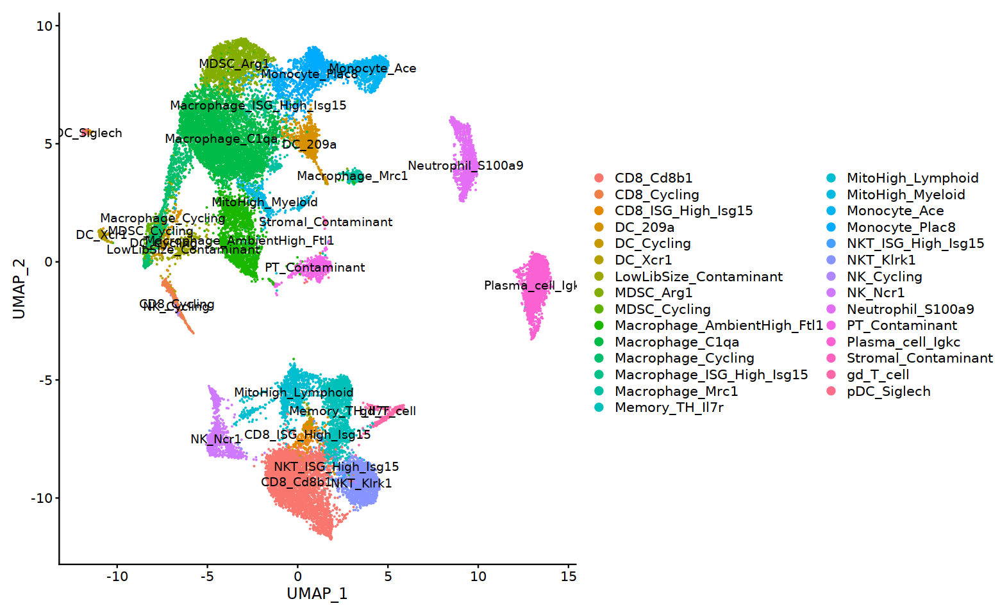

In [41]:
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_isg@meta.data, seurat_clusters == 0)),value = "CD8_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_isg@meta.data, seurat_clusters == 1)),value = "NKT_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_t_isg@meta.data, seurat_clusters == 2)),value = "LowLibSize_Contaminant")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

In [42]:
seur_i$Annot_Imm_1_Cycling_ISG_Resolved = Idents(seur_i)

In [43]:
saveRDS(seur_i, file = "Manuscript_Objects/Immune_SeuratObject.RDS")

### 3. Subset, reproject, and recluster broad cell types (CD8, NK, T-Helper, etc) to identify mis-annotated and contaminant cells and arrive at granular annotations

In [55]:
seur_i = readRDS("Manuscript_Objects/Immune_SeuratObject.RDS")
Idents(seur_i) = "Annot_Imm_1_Cycling_ISG_Resolved"

Centering and scaling data matrix

PC_ 1 
Positive:  Ccl5, Rps18, Rpl13, Gm42418, Rpl32, Rps28, Ccnd2, Rps7, Btg2, Rps8 
	   Ccl4, Itga4, Cd8b1, Prf1, Bcl2, Rps12, Ltb, Rpl23a, Junb, Rpl36a 
	   Kdm5b, Gzmk, Hbb-bs, Cd8a, Rpl10a, Ifi203, Rpl10, Sat1, Serpina3g, Aldoa 
Negative:  Pclaf, Nusap1, Birc5, Spc24, Stmn1, Mki67, Hist1h3c, Top2a, Knl1, Ccna2 
	   Esco2, Rrm2, Tpx2, Cdca3, Cenpf, Kif11, Hist1h1b, Cdca8, Cks1b, Cdk1 
	   Hmmr, Mxd3, Hist1h2ae, Ube2c, Kif15, Hist1h2ab, Hist1h2ap, Ccnb2, Aurkb, Hist1h2af 
PC_ 2 
Positive:  Klf2, Cx3cr1, Zeb2, Lgals1, Klrg1, Emp3, Il18rap, mt-Co2, Ccl5, S1pr1 
	   S1pr5, Rasgrp2, mt-Atp6, Gzma, Ripor2, Spn, mt-Co3, Klf3, H2afz, Ahnak 
	   Borcs7, Itga4, S100a10, Flna, Actb, Arhgef18, Prf1, As3mt, mt-Co1, Rap1gap2 
Negative:  Isg20, Rps20, Xcl1, Rps2, Ly6e, Rps12, Rpl13, Rpl32, Rps18, Rps7 
	   Rps19, Rpsa, Rpl36a, Rpl3, Rps28, Rpl10, Rpl10a, Jaml, Bcl2, Cxcr6 
	   Inpp4b, Isg15, Ifit1, Bst2, Socs1, Ifit3, Ctsw, Rpl23a, Rps26, Npm1 
PC_ 3 
Positive: 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3959
Number of edges: 151255

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8612
Number of communities: 8
Elapsed time: 0 seconds


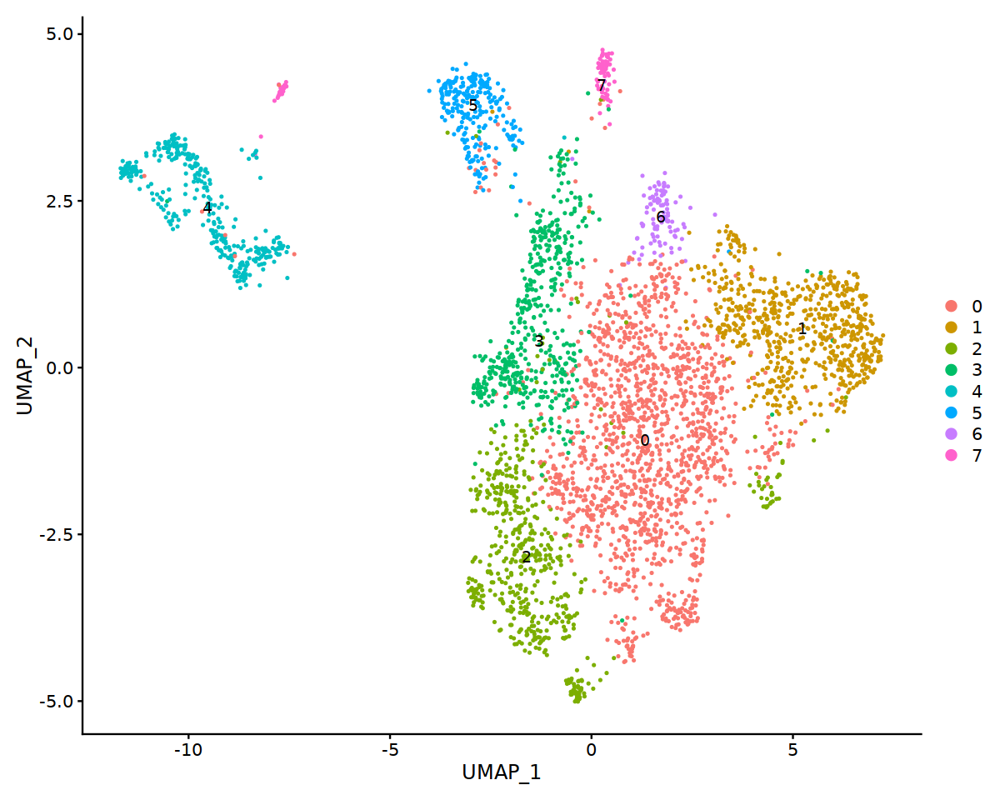

In [56]:
options(repr.plot.width=10, repr.plot.height=8)

seur_cd8 = subset(seur_i, idents = c("CD8_Cd8b1","CD8_Cycling","CD8_ISG_High_Isg15"))
seur_cd8 <- NormalizeData(seur_cd8)
seur_cd8 <- FindVariableFeatures(seur_cd8, selection.method = "vst",nfeatures = 3000)
seur_cd8 <- ScaleData(seur_cd8, features = row.names(seur_cd8))
seur_cd8 <- RunPCA(seur_cd8, npcs = 30,verbose = T)
seur_cd8 <- RunHarmony(seur_cd8, group.by.vars = "Sample")
seur_cd8 <- RunUMAP(seur_cd8, reduction = "harmony", dims = 1:30)
seur_cd8 <- FindNeighbors(seur_cd8, reduction = "harmony", dims = 1:30)
seur_cd8 <- FindClusters(seur_cd8, resolution = 0.3)
DimPlot(seur_cd8, label = T)

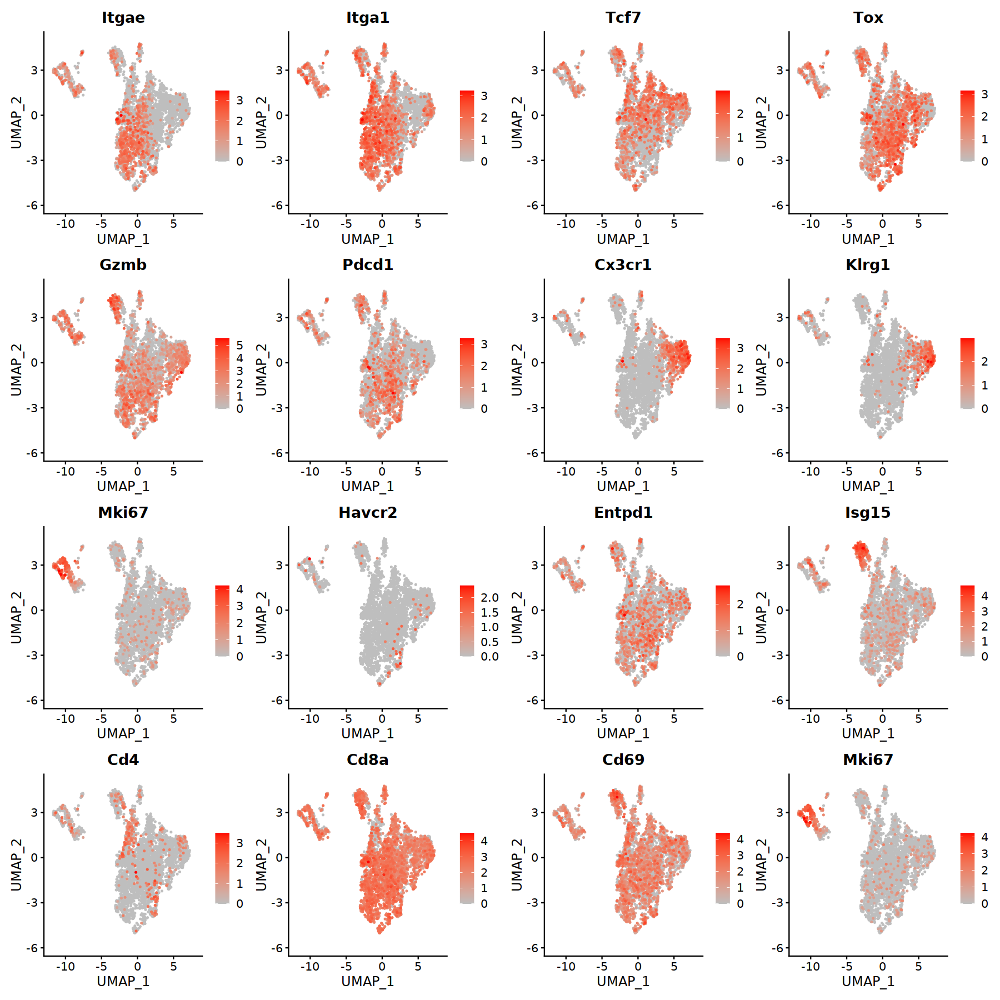

In [57]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_cd8, c("Itgae","Itga1","Tcf7","Tox","Gzmb","Pdcd1","Cx3cr1","Klrg1","Mki67","Havcr2","Entpd1","Isg15","Cd4","Cd8a","Cd69","Mki67"),order = T,cols = c("grey","red"))


In [58]:
markers_cd8 <- FindAllMarkers(seur_cd8, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",test.use = "LR",latent.vars = "Sample")
markers_cd8 %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 5

Calculating cluster 6

Calculating cluster 7



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
9.944673e-70,0.6549072,0.752,0.511,2.373893e-65,0,Gzmk
1.434725e-37,0.7028009,0.397,0.234,3.424832e-33,0,Tcrg-C2
9.971735e-34,0.5220048,0.674,0.561,2.380353e-29,0,2410006H16Rik
1.259391e-30,0.5853221,0.369,0.213,3.006292e-26,0,Trgv2
5.625174e-22,0.5648800,0.521,0.367,1.342785e-17,0,Ccl4
0.000000e+00,2.9674314,0.954,0.248,0.000000e+00,1,Klf2
6.134627e-284,1.6326394,0.995,0.958,1.464397e-279,1,Ccl5
2.090834e-244,2.0358932,0.594,0.044,4.991030e-240,1,Cx3cr1
1.308942e-203,2.0873527,0.607,0.118,3.124574e-199,1,Zeb2


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



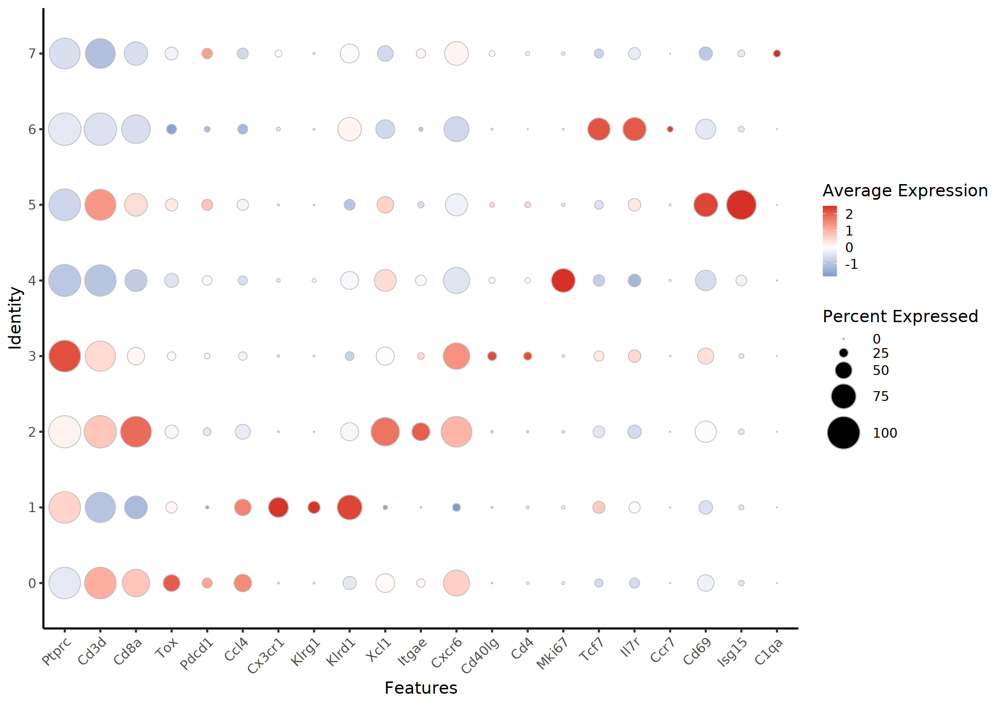

In [59]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_cd8, features = c("Ptprc","Cd3d","Cd8a","Tox","Pdcd1","Ccl4","Cx3cr1","Klrg1","Klrd1","Xcl1","Itgae","Cxcr6","Cd40lg","Cd4","Mki67","Tcf7","Il7r","Ccr7","Cd69","Isg15","C1qa"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

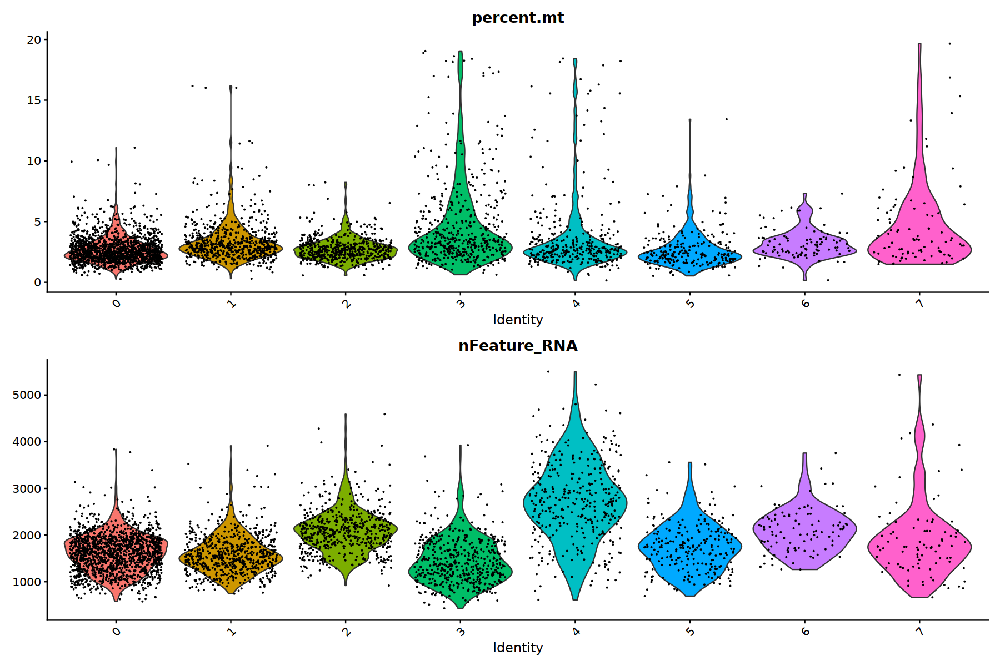

In [60]:
options(repr.plot.width=15, repr.plot.height=10)
VlnPlot(seur_cd8, features = c("percent.mt","nFeature_RNA"), ncol =1)

In [61]:
#0 CD8_Tox
#1 CD8_Effector_Cx3cr1
#2 CD8_Trm_Itgae
#3 LowLibSize_THlike_Unidentified
#4 CD8_Cycling_Mki67
#5 CD8_ISG_High_Isg15
#6 CD8_Memory_Il7r
#7 Myeloid_Contaminant

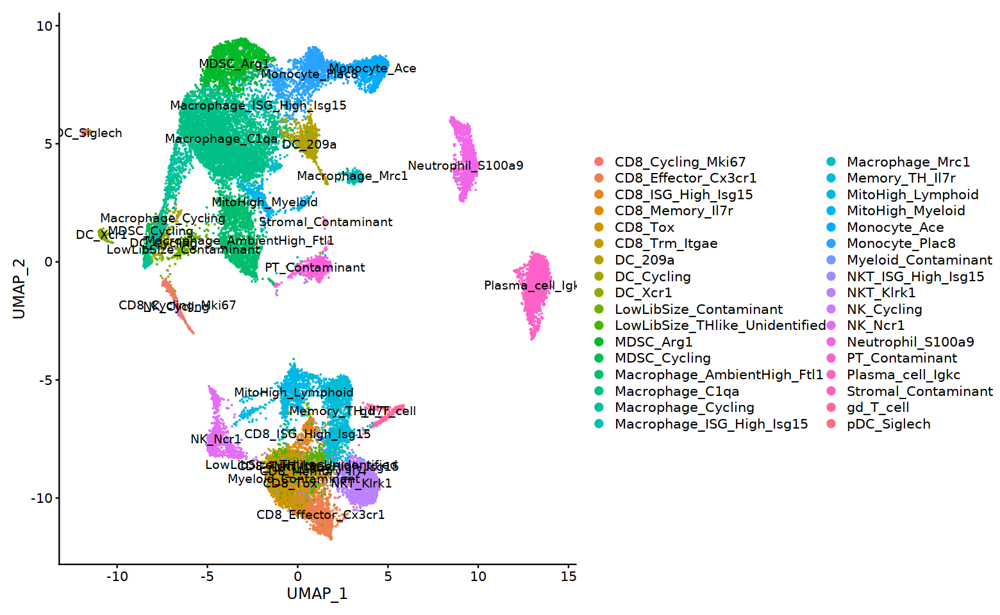

In [62]:
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 0)),value = "CD8_Tox")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 1)),value = "CD8_Effector_Cx3cr1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 2)),value = "CD8_Trm_Itgae")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 3)),value = "LowLibSize_THlike_Unidentified")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 4)),value = "CD8_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 5)),value = "CD8_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 6)),value = "CD8_Memory_Il7r")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd8@meta.data, seurat_clusters == 7)),value = "Myeloid_Contaminant")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  Rps20, Rps19, Rplp1, Rpl12, Rps28, Rpl13, Rps7, Rpl23, Rps18, Rplp0 
	   Rps10, Rps3, Rps8, Rpl32, Rplp2, Rps4x, Rps26, Rpl36a, Rps15a, Rpl10a 
	   Rpl39, Rps5, Rps6, Rpl9, Rpsa, Eef1b2, Rpl28, Rpl3, Rpl5, Rps2 
Negative:  S100a4, Itgb1, S100a6, Ahnak, Maf, Lgals1, Ikzf2, Tnfrsf4, Id2, S100a11 
	   Ly6a, Cxcr3, AU020206, Actb, Cd4, Rgs1, Serinc3, Capg, Cish, Icos 
	   Tnfrsf18, Nrp1, S100a10, Prr13, AW112010, Srgn, Mdfic, Cd44, Bcl2a1b, Ctla4 
PC_ 2 
Positive:  Rpl41, Rps12, Rpl32, Sh3bgrl3, Rps15a, Rps5, Rpl39, Rps7, Rps4x, Fth1 
	   Rpl9, Rpsa, Rpl23, Cd52, Rps2, Rplp0, Rps18, Rps10, Lgals1, Rpl13 
	   Rpl10, Rps26, Rpl28, Rpl3, Rplp1, Pfn1, Rps28, Rpl15, Rpl12, Rps3 
Negative:  mt-Cytb, S1pr1, mt-Nd4, Crlf3, Slamf6, mt-Nd2, Actn1, Klf3, Satb1, Sell 
	   Fam169b, Trib2, Lef1, Macf1, Gm14085, Rapgef6, Ccr7, St8sia6, Rflnb, Itga4 
	   Tspan32, Tet3, Ift80, Bach2, Arhgef18, Gm8369, Phf20l1, Txk, mt-Nd3, Peli1 
PC_ 3 
Positive:  Ftl1, 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1391
Number of edges: 64548

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8857
Number of communities: 5
Elapsed time: 0 seconds


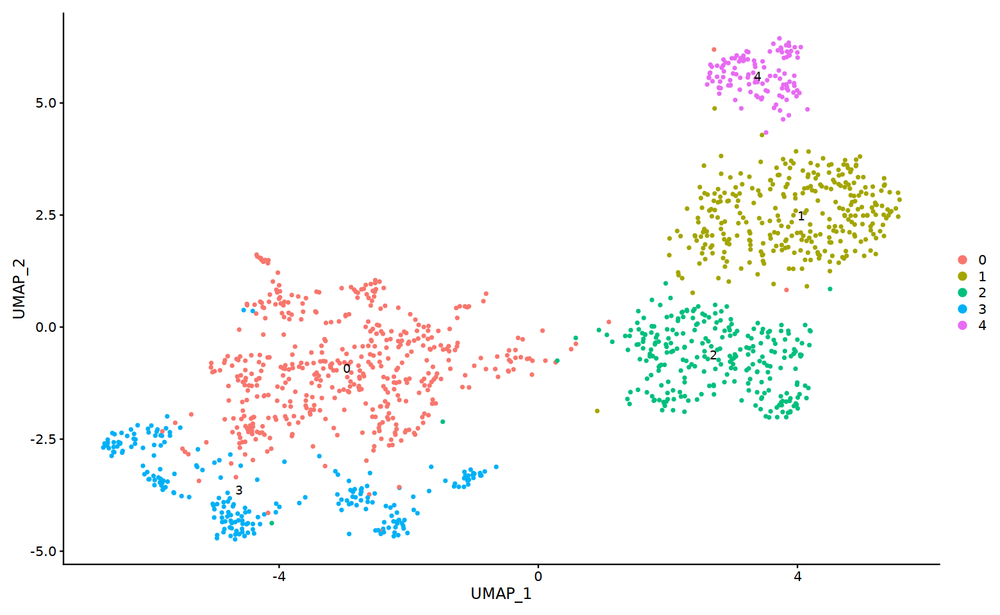

In [63]:
seur_cd4 = subset(seur_i, idents = c("Memory_TH_Il7r"))
seur_cd4 <- NormalizeData(seur_cd4)
seur_cd4 <- FindVariableFeatures(seur_cd4, selection.method = "vst",nfeatures = 3000)
seur_cd4 <- ScaleData(seur_cd4, features = row.names(seur_cd4))
seur_cd4 <- RunPCA(seur_cd4, npcs = 30,verbose = T)
seur_cd4 <- RunHarmony(seur_cd4, group.by.vars = "Sample")
seur_cd4 <- RunUMAP(seur_cd4, reduction = "harmony", dims = 1:30)
seur_cd4 <- FindNeighbors(seur_cd4, reduction = "harmony", dims = 1:30)
seur_cd4 <- FindClusters(seur_cd4, resolution = 0.3)
DimPlot(seur_cd4, label = T)

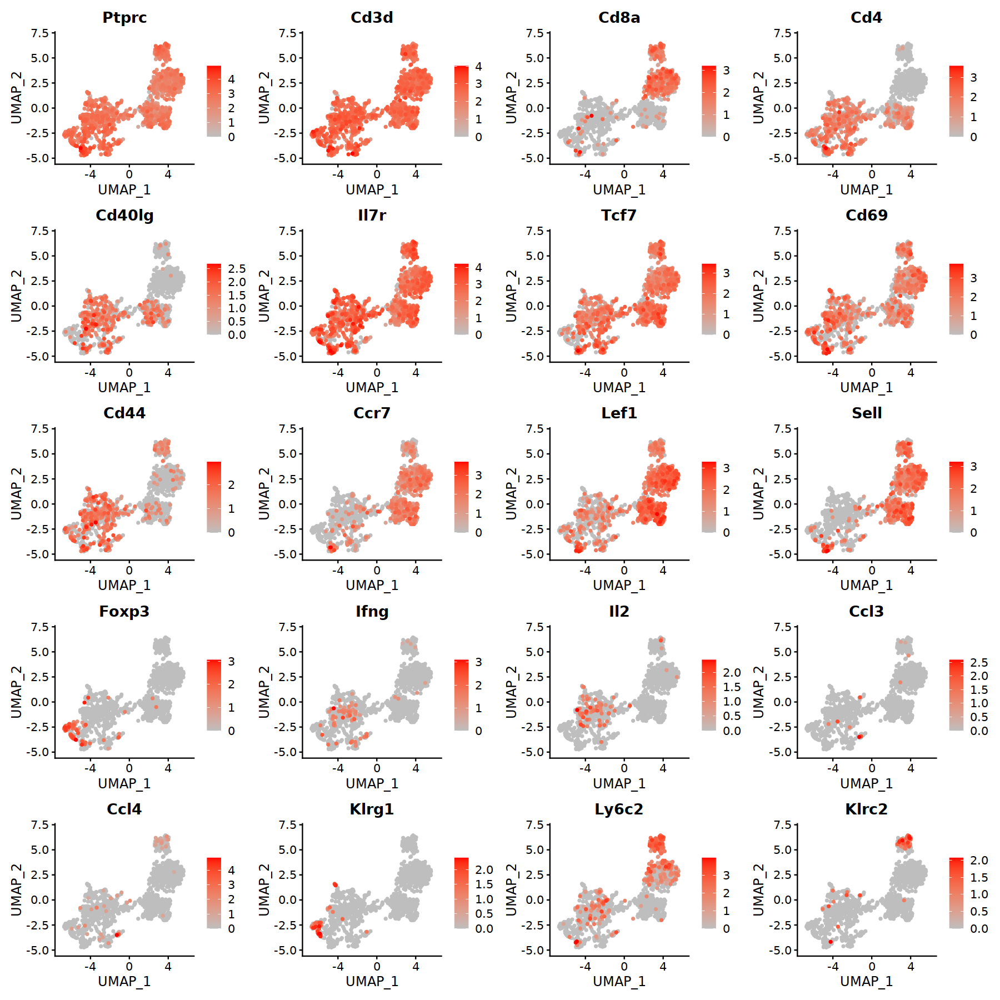

In [64]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_cd4, c("Ptprc","Cd3d","Cd8a","Cd4","Cd40lg","Il7r","Tcf7","Cd69","Cd44","Ccr7","Lef1","Sell","Foxp3","Ifng","Il2","Ccl3","Ccl4","Klrg1","Ly6c2","Klrc2"),order = T,cols = c("grey","red"))


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



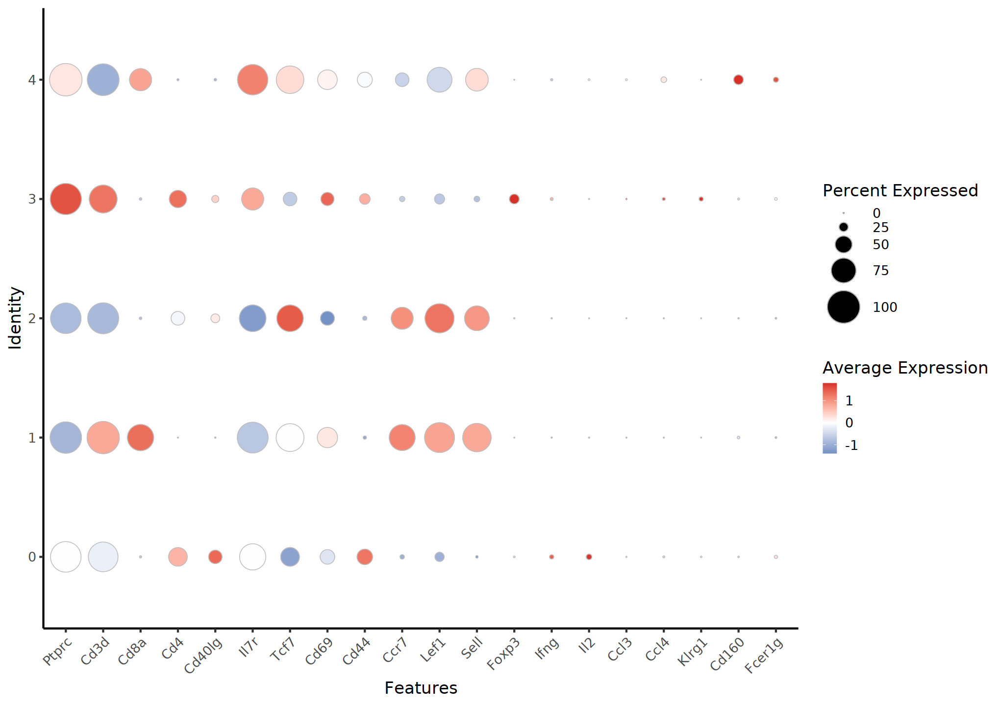

In [65]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_cd4, features = c("Ptprc","Cd3d","Cd8a","Cd4","Cd40lg","Il7r","Tcf7","Cd69","Cd44","Ccr7","Lef1","Sell","Foxp3","Ifng","Il2","Ccl3","Ccl4","Klrg1","Cd160","Fcer1g"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [66]:
markers_cd4 <- FindAllMarkers(seur_cd4, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")
markers_cd4 %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3.038029e-103,1.8840388,0.838,0.427,7.252079e-99,0,Id2
2.970649e-88,1.8169295,0.840,0.403,7.091237e-84,0,S100a6
2.487623e-82,1.8309083,0.721,0.204,5.938206e-78,0,S100a4
2.511144e-81,1.6341723,0.789,0.322,5.994351e-77,0,Itgb1
7.346596e-73,1.6750473,0.780,0.374,1.753706e-68,0,Lgals1
1.752086e-72,1.2651014,0.870,0.567,4.182405e-68,0,S100a11
1.914391e-68,1.2754389,0.810,0.400,4.569842e-64,0,Ly6a
4.754917e-58,1.4835263,0.497,0.157,1.135046e-53,0,Cxcr6
2.423699e-56,1.2659068,0.548,0.164,5.785612e-52,0,Cxcr3


In [67]:
#0 CD4_EffectorMem_Id2
#1 CD8_Naive_Sell
#2 CD4_Naive_Lef1
#3 T_reg_Foxp3
#4 CD8_EffectorMem_Klrc2

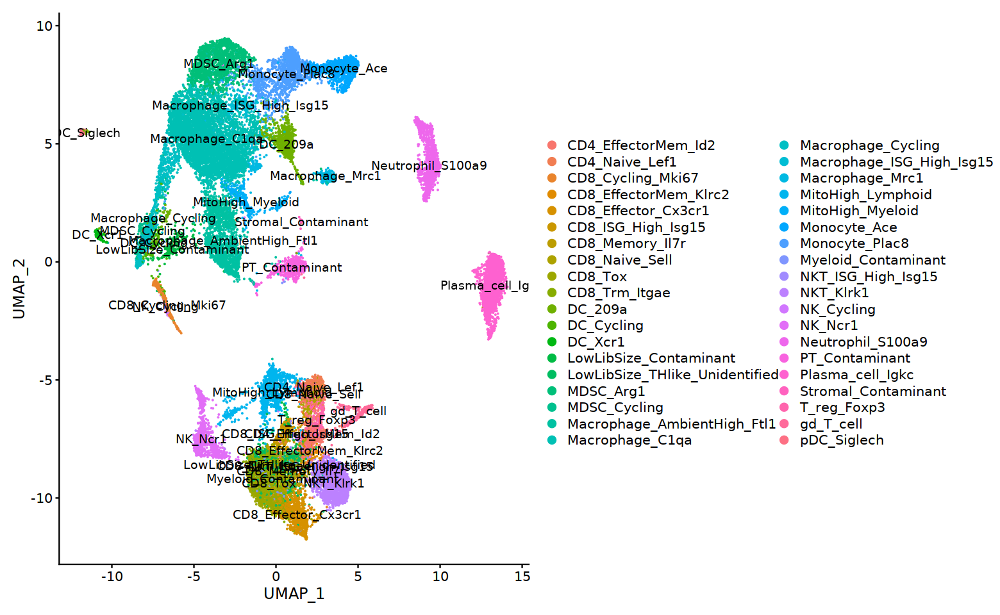

In [68]:
#0 CD4_EffectorMem_Id2
#1 CD8_Naive_Sell
#2 CD4_Naive_Lef1
#3 T_reg_Foxp3
#4 CD8_EffectorMem_Klrc2

seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd4@meta.data, seurat_clusters == 0)),value = "CD4_EffectorMem_Id2")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd4@meta.data, seurat_clusters == 1)),value = "CD8_Naive_Sell")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd4@meta.data, seurat_clusters == 2)),value = "CD4_Naive_Lef1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd4@meta.data, seurat_clusters == 3)),value = "T_reg_Foxp3")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_cd4@meta.data, seurat_clusters == 4)),value = "CD8_EffectorMem_Klrc2")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  Pclaf, Birc5, Rrm2, Mki67, Fcer1g, Top2a, Cdk1, Kif11, Spc24, Nusap1 
	   Tyrobp, Hist1h3c, Stmn1, Cdca3, Ccna2, Hist1h1b, Esco2, Aurkb, Rad51, Car2 
	   Knl1, Tk1, Prc1, Cenpf, Pbk, Cd7, Sgo1, Hist1h2af, Tpx2, Hist1h2ab 
Negative:  Cd3d, Cd3e, Cd3g, Il7r, Thy1, Bcl11b, Ly6a, Trac, Lat, Gm26740 
	   Trbc2, Maf, Icos, Serpinb1a, Il18r1, Ltb4r1, Gpr183, Tmem64, Gramd3, Cd40lg 
	   Ramp1, Rora, Cd163l1, Ifngr1, Podnl1, Cd28, Ltb, Il17re, Blk, Tcrg-C1 
PC_ 2 
Positive:  Serpinb1a, Ltb4r1, Cd163l1, Ramp1, Tmem176a, Blk, Actn2, Tmem176b, Emb, Trdv4 
	   Trdc, Il17re, Aqp3, Kcnk1, Rorc, Igf1r, Il1r1, Mmp25, Tcrg-C1, Rora 
	   Ppp1r14c, Bcl2a1a, Maf, Prelid2, Krt83, Selenop, Il23r, Gpx1, Tcrg-V6, Gpr183 
Negative:  Nkg7, Ms4a4b, Klrd1, Klrk1, AW112010, Ccl5, Ctsw, Rps15a, Rpl32, Rps7 
	   Rps18, Rpl39, Ly6c2, Rpsa, Epsti1, Xcl1, Klre1, Dusp2, Rpl3, Rps12 
	   Klrc2, Itga1, Il2rb, Klra9, Gm2682, Rps8, Ctla2a, Inpp4b, Bcl2, Klrb1c 
PC_ 3 
Posi

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2787
Number of edges: 115331

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9034
Number of communities: 10
Elapsed time: 0 seconds


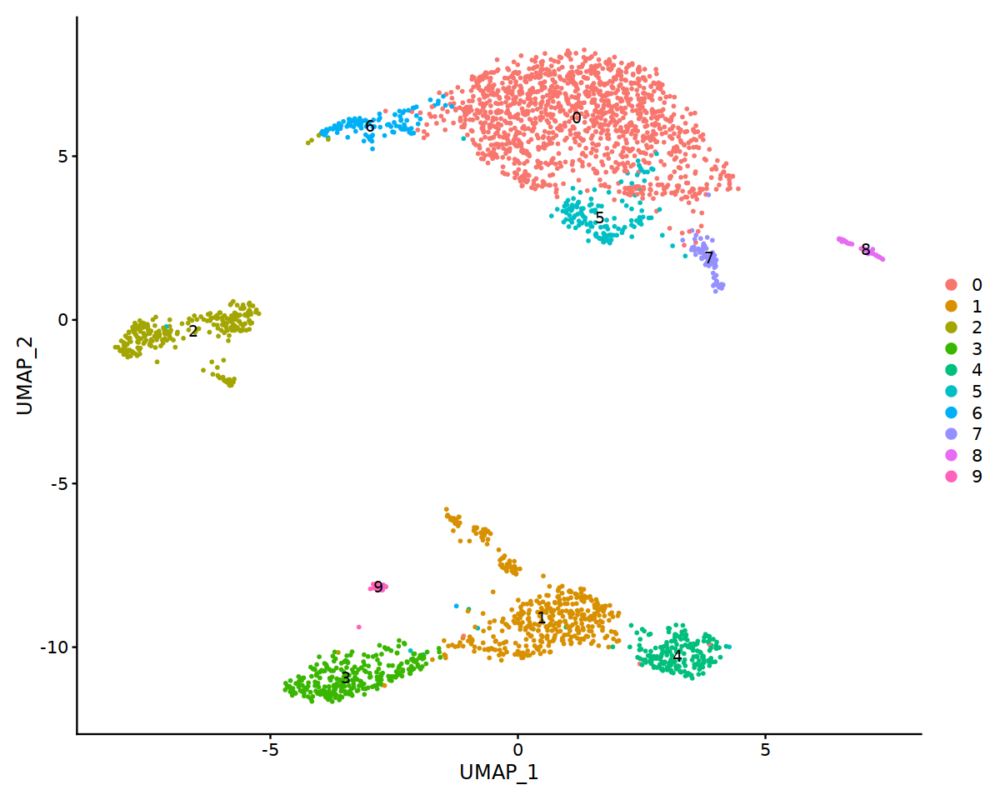

In [69]:
options(repr.plot.width=10, repr.plot.height=8)

seur_nk = subset(seur_i, idents = c("NK_Ncr1","NKT_Klrk1","NKT_ISG_High_Isg15","NK_Cycling","gd_T_cell"))
seur_nk <- NormalizeData(seur_nk)
seur_nk <- FindVariableFeatures(seur_nk, selection.method = "vst",nfeatures = 3000)
seur_nk <- ScaleData(seur_nk, features = row.names(seur_nk))
seur_nk <- RunPCA(seur_nk, npcs = 30,verbose = T)
seur_nk <- RunHarmony(seur_nk, group.by.vars = "Sample")
seur_nk <- RunUMAP(seur_nk, reduction = "harmony", dims = 1:30)
seur_nk <- FindNeighbors(seur_nk, reduction = "harmony", dims = 1:30)
seur_nk <- FindClusters(seur_nk, resolution = 0.3)
DimPlot(seur_nk, label = T)

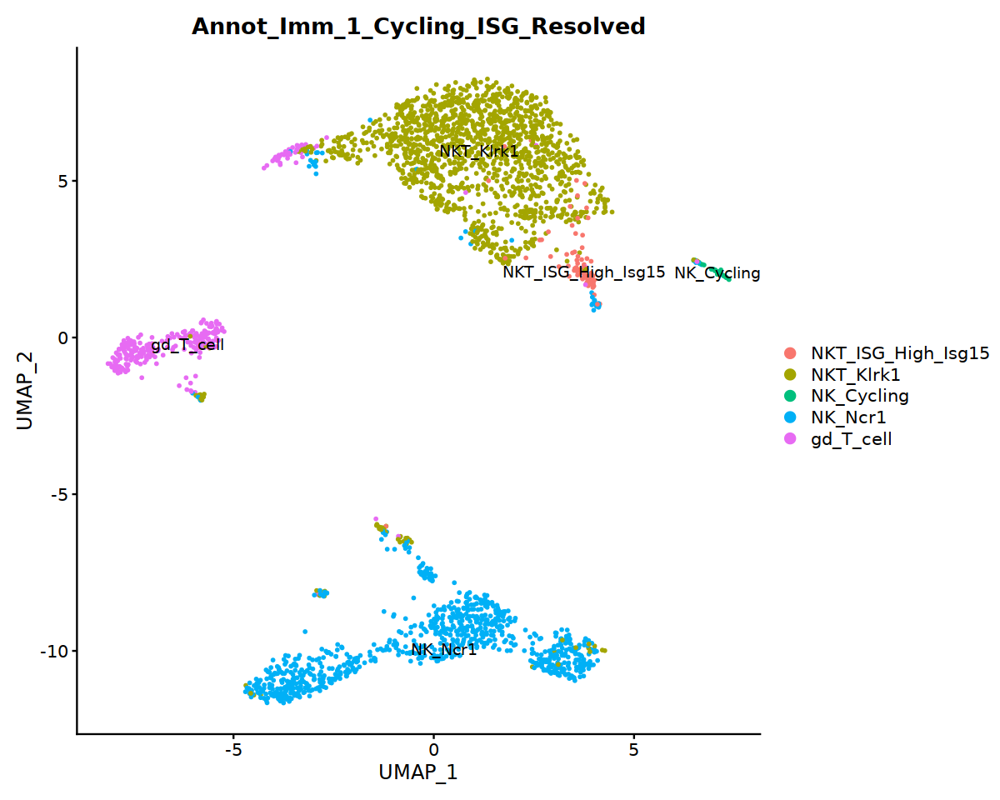

In [70]:
options(repr.plot.width=10, repr.plot.height=8)

DimPlot(seur_nk, label = T,group.by = "Annot_Imm_1_Cycling_ISG_Resolved")

In [71]:
markers_nk <- FindAllMarkers(seur_nk, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")
markers_nk %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 5

Calculating cluster 6

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 7

Calculating cluster 8

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.f

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
4.783913e-130,0.9974568,0.661,0.192,1.141968e-125,0,Gramd3
1.202047e-129,0.9447016,0.779,0.275,2.869405e-125,0,Ly6a
6.887554e-119,1.0726676,0.762,0.288,1.644128e-114,0,Ly6c2
9.919728e-93,1.0985365,0.630,0.294,2.367938e-88,0,Rcbtb2
9.442413e-65,1.4808389,0.395,0.134,2.253998e-60,0,Ifitm2
1.582270e-184,1.8341292,0.797,0.084,3.777037e-180,1,Klrb1b
3.877375e-164,1.9099425,0.950,0.466,9.255681e-160,1,Fcer1g
1.285170e-139,3.8554026,0.621,0.074,3.067829e-135,1,Gzmc
1.363433e-132,1.9179011,0.916,0.468,3.254651e-128,1,Cd7


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



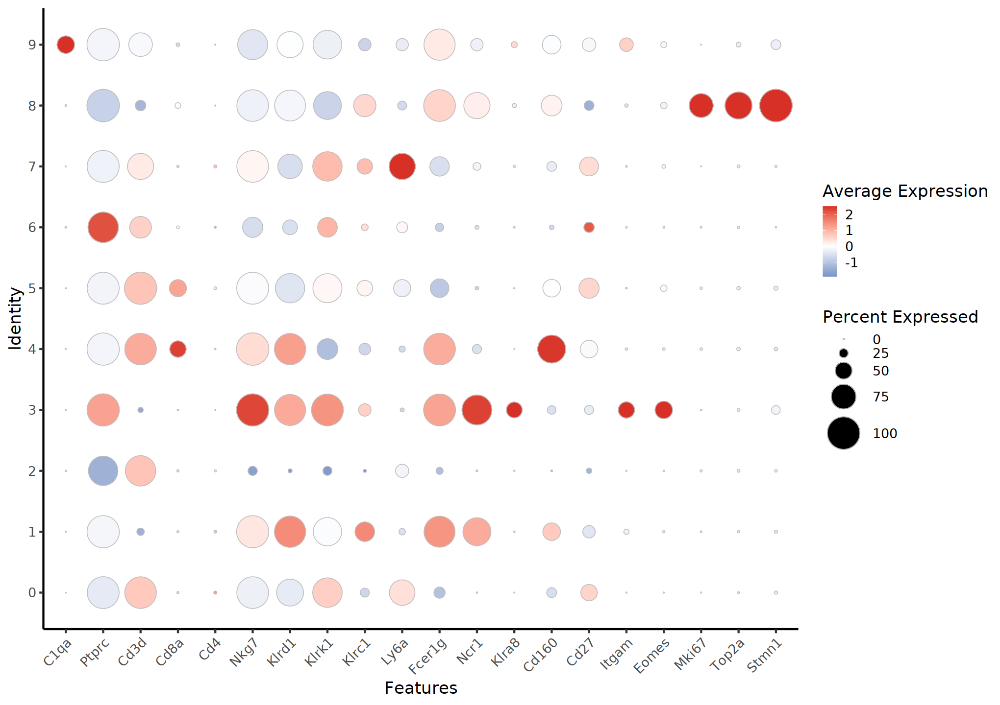

In [72]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_nk, features = c( "C1qa","Ptprc","Cd3d","Cd8a","Cd4","Nkg7","Klrd1","Klrk1","Klrc1","Ly6a","Fcer1g","Ncr1","Klra8","Cd160","Cd27","Itgam","Eomes","Mki67","Top2a","Stmn1"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

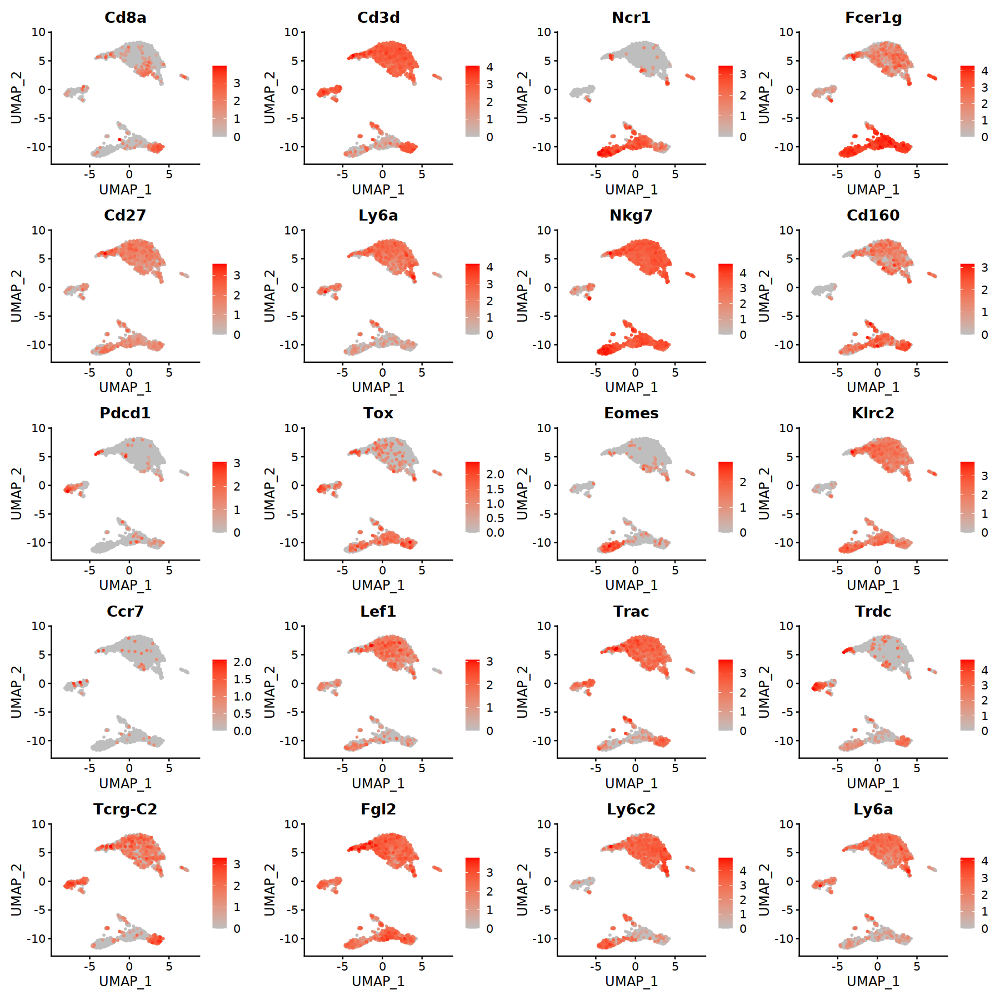

In [73]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_nk, c("Cd8a","Cd3d","Ncr1","Fcer1g","Cd27","Ly6a","Nkg7","Cd160","Pdcd1","Tox","Eomes","Klrc2","Ccr7","Lef1","Trac","Trdc","Tcrg-C2","Fgl2","Ly6c2","Ly6a"),order = T,cols = c("grey","red"))


In [74]:
#0 NKT_Ly6a
#1 NK_Klrb1b
#2 gd_T_cell_Trdc
#3 NK_Gzma
#4 CD8_NKlike_Cd160
#5 NKT_Cd8pos_Cd8b1
#6 MitoHigh_NKT
#7 NKT_ISG_High_Ifit3
#8 NK_Cycling_Mki67
#9 Myeloid_Contaminant

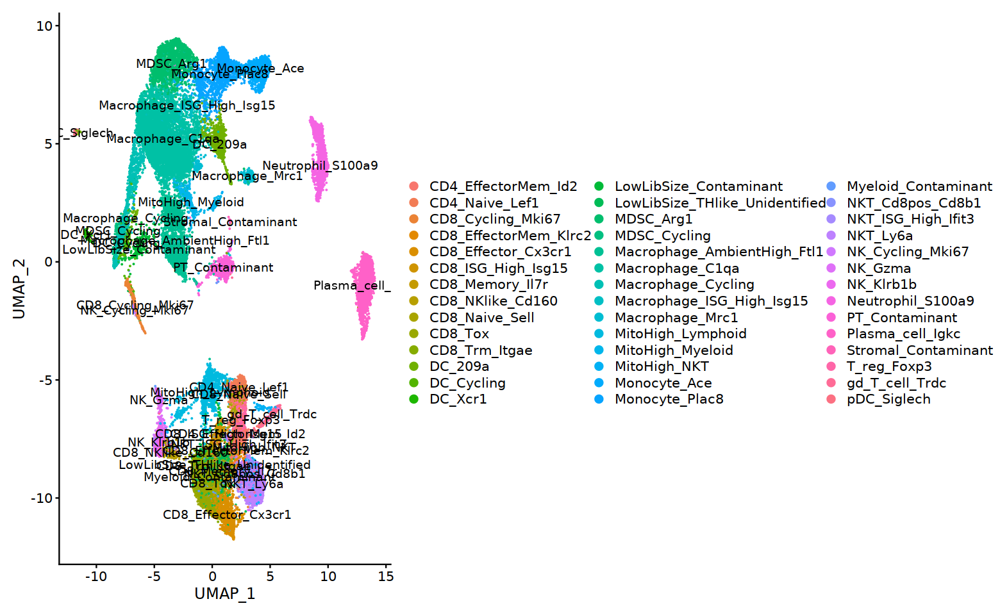

In [75]:
#0 NKT_Ly6a
#1 NK_Klrb1b
#2 gd_T_cell_Trdc
#3 NK_Gzma
#4 CD8_NKlike_Cd160
#5 NKT_Cd8pos_Cd8b1
#6 MitoHigh_NKT
#7 NKT_ISG_High_Ifit3
#8 NK_Cycling_Mki67
#9 Myeloid_Contaminant

seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 0)),value = "NKT_Ly6a")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 1)),value = "NK_Klrb1b")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 2)),value = "gd_T_cell_Trdc")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 3)),value = "NK_Gzma")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 4)),value = "CD8_NKlike_Cd160")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 5)),value = "NKT_Cd8pos_Cd8b1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 6)),value = "MitoHigh_NKT")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 7)),value = "NKT_ISG_High_Ifit3")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 8)),value = "NK_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_nk@meta.data, seurat_clusters == 9)),value = "Myeloid_Contaminant")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  C1qc, C1qb, C1qa, Pmepa1, Trem2, Cd81, Hexb, Lgmn, Grn, Ms4a7 
	   Apoe, Stab1, Fcrls, Olfml3, Cd63, Atpif1, Itgb5, Tuba1b, Timp2, Ctss 
	   Stmn1, Ctsz, Prdx1, Lgals1, C3ar1, Anxa3, Cxcl16, Bst2, Hmgn1, Tmem37 
Negative:  Gsr, S100a11, Cytip, S100a6, Pglyrp1, Hp, Plac8, Napsa, Il1b, Ifitm6 
	   S100a8, S100a9, Gpr141, Cxcr2, Itgal, Rara, Pim1, Neat1, Slpi, Dusp1 
	   Itga4, Nr4a1, Sell, Mcemp1, Csf3r, Ltb, Gda, Ace, Lyst, Mmp9 
PC_ 2 
Positive:  Top2a, Pclaf, Mki67, Nusap1, Hist1h1b, Kif11, Birc5, Prc1, Spc24, Knl1 
	   Ccna2, Cdca8, Cdca3, Cenpf, Tpx2, Stmn1, Kif15, Pbk, Esco2, Cdk1 
	   Hist1h3c, Hmgb2, Cenpe, Hist1h2ae, Hmmr, Aurkb, Ckap2l, Spc25, Ube2c, Bub1b 
Negative:  Apoe, Cd63, Ctsd, Trem2, Ms4a7, Fth1, Ftl1, Timp2, C3ar1, C1qc 
	   C1qa, C1qb, Ctsb, Lgmn, Igf1, Mafb, Abca1, Stab1, Anxa3, Trf 
	   Hexb, Selenop, Ctsz, Tmem37, Bhlhe41, Cd81, Itgb5, Lyz2, Pld3, Grn 
PC_ 3 
Positive:  Clec4d, S100a8, S100a9, Txn1, Grina, Adam8

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12453
Number of edges: 470631

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9353
Number of communities: 16
Elapsed time: 3 seconds


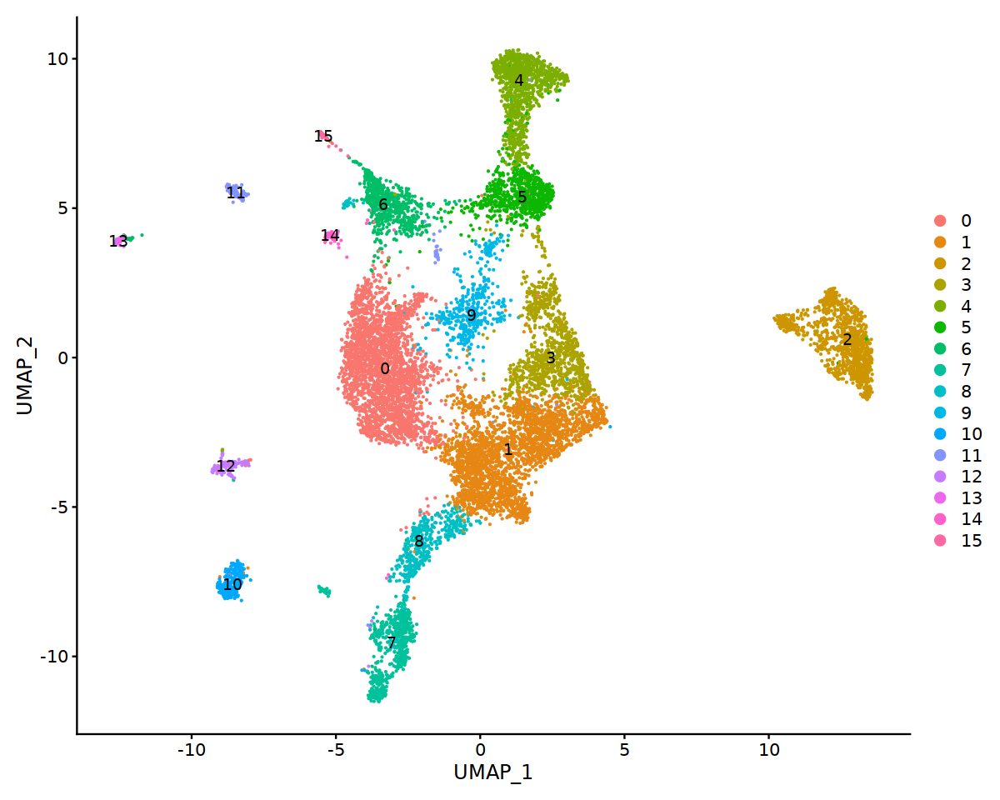

In [76]:
options(repr.plot.width=10, repr.plot.height=8)

seur_myl = subset(seur_i, idents = c("DC_209a","DC_Cycling","DC_Xcr1","MDSC_Arg1","MDSC_Cycling","Macrophage_C1qa","Macrophage_Cycling","Macrophage_ISG_High_Isg15","Macrophage_Mrc1","Monocyte_Ace","Monocyte_Plac8","pDC_Siglech","Neutrophil_S100a9"))
seur_myl <- NormalizeData(seur_myl)
seur_myl <- FindVariableFeatures(seur_myl, selection.method = "vst",nfeatures = 3000)
seur_myl <- ScaleData(seur_myl, features = row.names(seur_myl))
seur_myl <- RunPCA(seur_myl, npcs = 30,verbose = T)
seur_myl <- RunHarmony(seur_myl, group.by.vars = "Sample")
seur_myl <- RunUMAP(seur_myl, reduction = "harmony", dims = 1:30)
seur_myl <- FindNeighbors(seur_myl, reduction = "harmony", dims = 1:30)
seur_myl <- FindClusters(seur_myl, resolution = 0.3)
DimPlot(seur_myl, label = T)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12453
Number of edges: 470631

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9052
Number of communities: 22
Elapsed time: 3 seconds


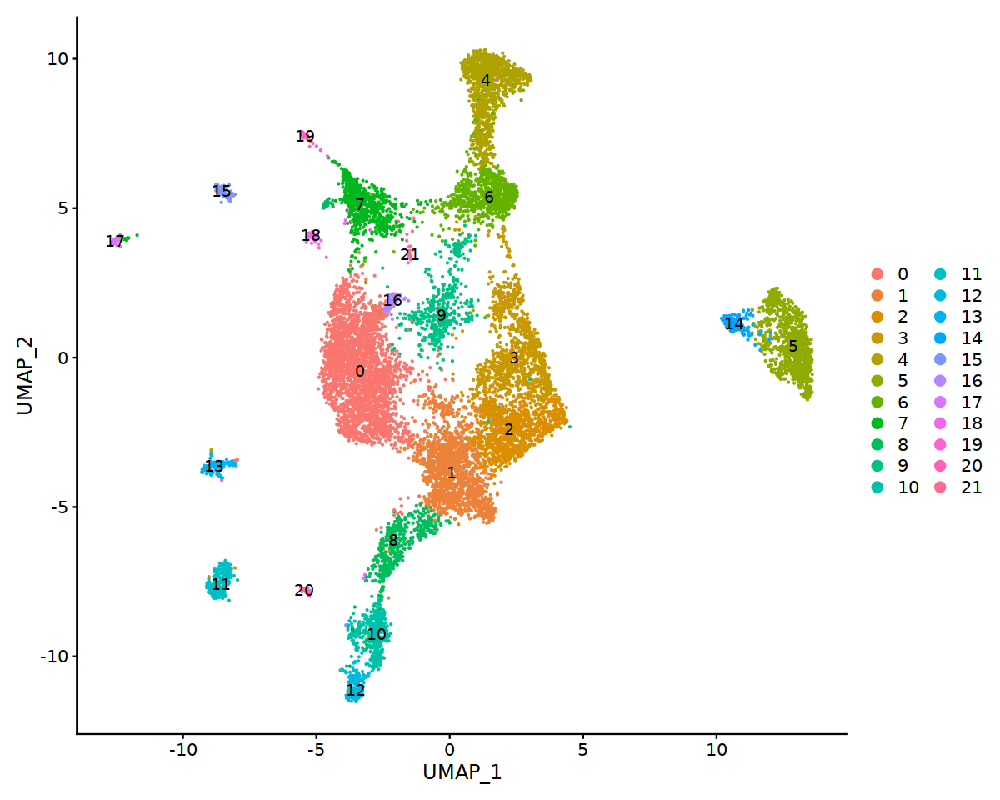

In [78]:
options(repr.plot.width=10, repr.plot.height=8)
seur_myl <- FindClusters(seur_myl, resolution = 0.6)
DimPlot(seur_myl, label = T)

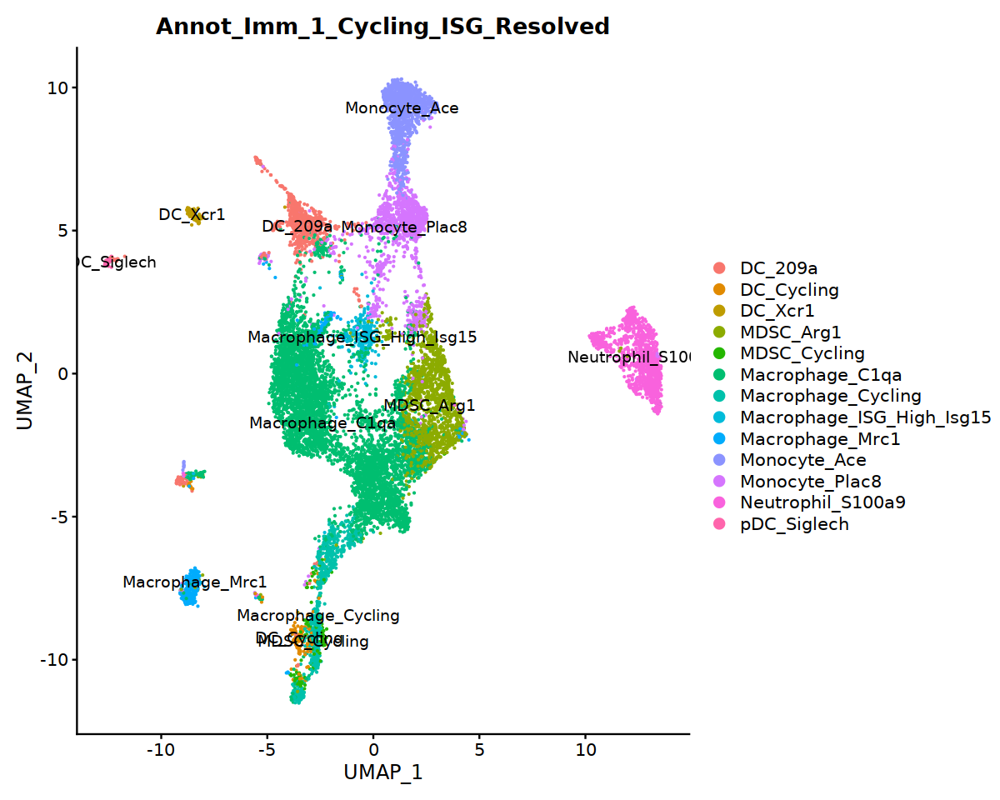

In [79]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(seur_myl, label = T, group.by = "Annot_Imm_1_Cycling_ISG_Resolved")

In [80]:
markers_myl <- FindAllMarkers(seur_myl, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")
markers_myl %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilities numerically 0 or 1 occurred"
Warning message:
"glm.fit: fitted probabilit

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.704890,0.849,0.548,0.000000e+00,0,H2-Eb1
0.000000e+00,1.648432,0.949,0.797,0.000000e+00,0,Cd74
0.000000e+00,1.589481,0.845,0.573,0.000000e+00,0,H2-Aa
0.000000e+00,1.578435,0.892,0.661,0.000000e+00,0,H2-Ab1
0.000000e+00,1.135530,0.989,0.690,0.000000e+00,0,Tmem176b
0.000000e+00,1.427571,0.960,0.397,0.000000e+00,1,Olfml3
0.000000e+00,1.423810,0.997,0.541,0.000000e+00,1,Pmepa1
0.000000e+00,1.277140,1.000,0.797,0.000000e+00,1,Hexb
1.173967e-301,1.233823,0.999,0.782,2.802377e-297,1,Ctsd


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



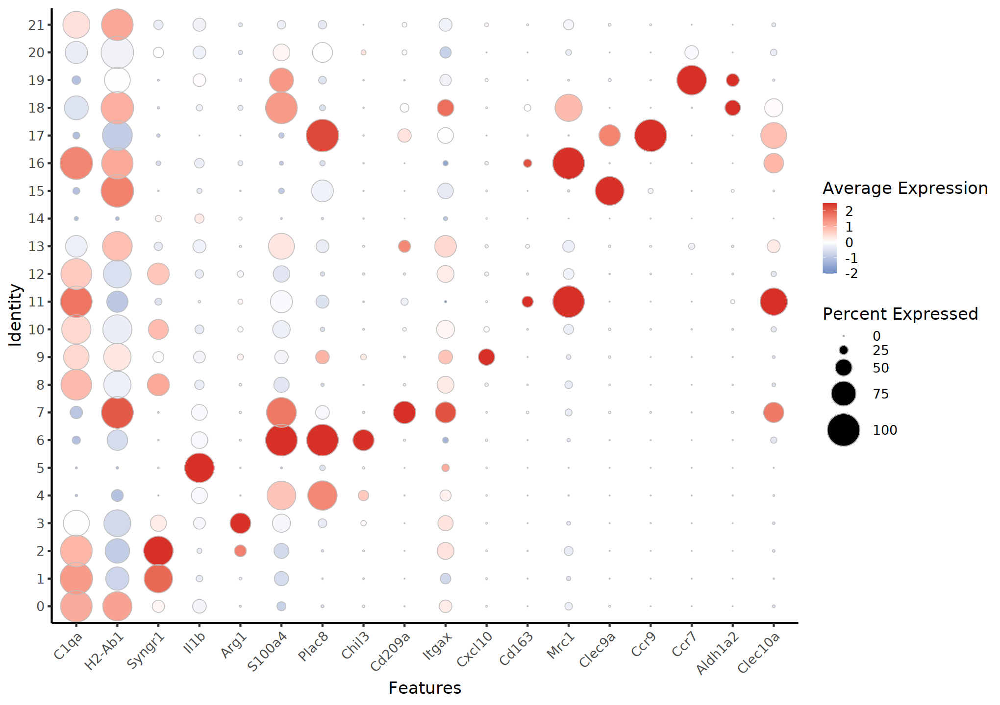

In [81]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_myl, features = c("C1qa","H2-Ab1","Syngr1","Il1b","Arg1","S100a4","Plac8","Chil3","Cd209a","Itgax","Cxcl10","Cd163","Mrc1","Clec9a","Ccr9","Ccr7","Aldh1a2","Clec10a"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [82]:
#0 Macrophage_H2Eb1
#1 Macrophage_Olfml3
#2 Macrophage_Fabp5
#3 MDSC_Arg1
#4 Monocyte_Ace
#5 Neutrophil_S100a9
#6 Monocyte_Plac8
#7 DC_Cd209a
#8 Macrophage_Cycling_Mcm6
#9 Myeloid_ISG_High_Isg15
#10 Macrophage_Cycling_Top2a
#11 Macrophage_Mrc1_1
#12 Macrophage_Cycling_Ccnb2
#13 Lymphoid_Contaminant
#14 Neutrophil_Ccl3
#15 DC_Xcr1
#16 Macrophage_Vcam1
#17 pDC_Siglech
#18 DC_Retnla
#19 DC_Ccr7
#20 Lymphoid_Contaminant
#21 PT_Contaminant

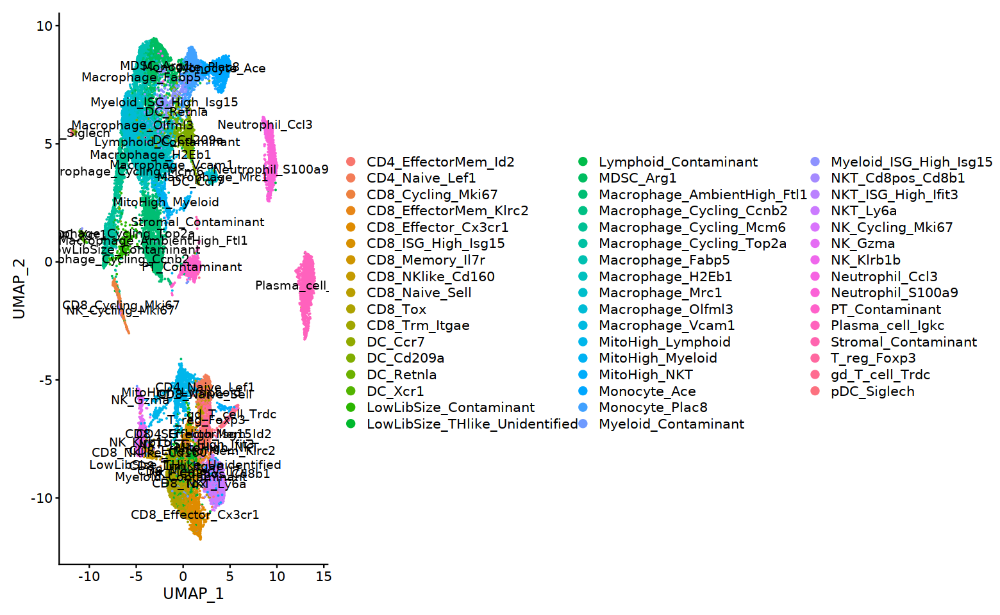

In [83]:
#0 Macrophage_H2Eb1
#1 Macrophage_Olfml3
#2 Macrophage_Fabp5
#3 MDSC_Arg1
#4 Monocyte_Ace
#5 Neutrophil_S100a9
#6 Monocyte_Plac8
#7 DC_Cd209a
#8 Macrophage_Cycling_Mcm6
#9 Myeloid_ISG_High_Isg15
#10 Macrophage_Cycling_Top2a
#11 Macrophage_Mrc1
#12 Macrophage_Cycling_Ccnb2
#13 Lymphoid_Contaminant
#14 Neutrophil_Ccl3
#15 DC_Xcr1
#16 Macrophage_Vcam1
#17 pDC_Siglech
#18 DC_Retnla
#19 DC_Ccr7
#20 Lymphoid_Contaminant
#21 PT_Contaminant

seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 0)),value = "Macrophage_H2Eb1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 1)),value = "Macrophage_Olfml3")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 2)),value = "Macrophage_Fabp5")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 3)),value = "MDSC_Arg1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 4)),value = "Monocyte_Ace")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 5)),value = "Neutrophil_S100a9")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 6)),value = "Monocyte_Plac8")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 7)),value = "DC_Cd209a")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 8)),value = "Macrophage_Cycling_Mcm6")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 9)),value = "Myeloid_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 10)),value = "Macrophage_Cycling_Top2a")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 11)),value = "Macrophage_Mrc1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 12)),value = "Macrophage_Cycling_Ccnb2")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 13)),value = "Lymphoid_Contaminant")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 14)),value = "Neutrophil_Ccl3")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 15)),value = "DC_Xcr1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 16)),value = "Macrophage_Vcam1")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 17)),value = "pDC_Siglech")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 18)),value = "DC_Retnla")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 19)),value = "DC_Ccr7")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 20)),value = "Lymphoid_Contaminant")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl@meta.data, seurat_clusters == 21)),value = "PT_Contaminant")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  Apoe, Cd63, Ctsd, Lyz2, Pmepa1, Trem2, Olfml3, Cd81, Ms4a7, Lgmn 
	   Ctsz, Stab1, Cx3cr1, Fth1, Tyrobp, Grn, Bst2, Ctsb, Ftl1, Basp1 
	   Rnase4, Timp2, Tmem119, Prdx5, Bcl2a1b, Syngr1, C3ar1, Mafb, Bhlhe41, Fcrls 
Negative:  Hmgb2, Napsa, S100a11, Ciita, Olfm1, Itgb7, Top2a, H2afx, Jaml, S100a10 
	   H2afv, Rnd3, Tiam1, S100a6, Klrd1, Nusap1, Emb, Rgs18, Mki67, Cbfa2t3 
	   Pclaf, Rnase6, 4930523C07Rik, Kif11, Hist1h1b, Dpp4, Smc4, Kif23, Stmn1, Spc24 
PC_ 2 
Positive:  Prc1, Birc5, Cenpf, Tpx2, Ube2c, Ccna2, Mki67, Hmmr, Incenp, Calm2 
	   Cdca3, Cdk1, Nusap1, Cdca8, Cenpe, Racgap1, Ccnb1, Cenpa, Smc4, Ube2s 
	   Tubb4b, Plk1, Tuba1c, Top2a, Spc25, Cks2, Ctsb, Arl6ip1, Sgo2a, Kif11 
Negative:  Cd74, Ccnd1, H2-Ab1, Plbd1, H2-Eb1, H2-Aa, H2-DMa, Cdca7, H2-DMb1, Napsa 
	   Ckb, Klrd1, Ciita, Rnase6, Flt3, Bri3bp, Dpp4, H2-Oa, Ung, Itgb7 
	   Mcm6, Hells, Jaml, H2-DMb2, Mcm4, Kctd14, Ccnd2, Mcm3, Bcl11a, Cst3 
PC_ 3 
Positive:  Hist1h

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1097
Number of edges: 36615

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8784
Number of communities: 7
Elapsed time: 0 seconds


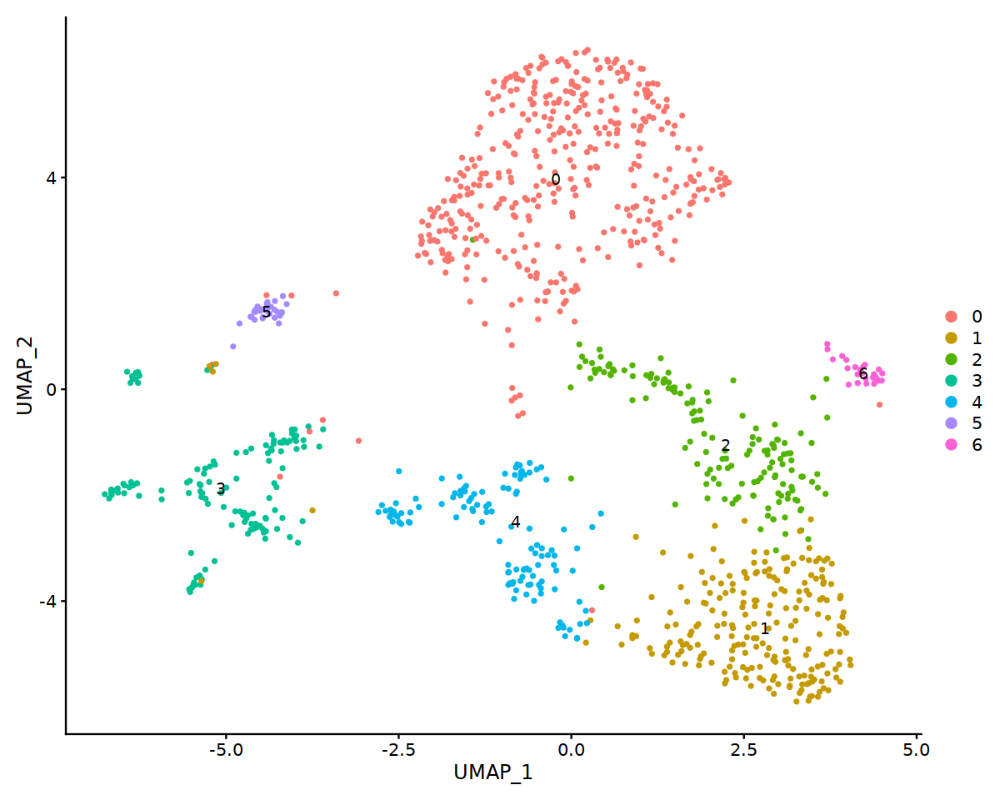

In [84]:
options(repr.plot.width=10, repr.plot.height=8)

seur_myl_cyc = subset(seur_myl, idents = c(8,10,12))
seur_myl_cyc <- NormalizeData(seur_myl_cyc)
seur_myl_cyc <- FindVariableFeatures(seur_myl_cyc, selection.method = "vst",nfeatures = 3000)
seur_myl_cyc <- ScaleData(seur_myl_cyc, features = row.names(seur_myl_cyc))
seur_myl_cyc <- RunPCA(seur_myl_cyc, npcs = 30,verbose = T)
seur_myl_cyc <- RunHarmony(seur_myl_cyc, group.by.vars = "Sample")
seur_myl_cyc <- RunUMAP(seur_myl_cyc, reduction = "harmony", dims = 1:20)
seur_myl_cyc <- FindNeighbors(seur_myl_cyc, reduction = "harmony", dims = 1:20)
seur_myl_cyc <- FindClusters(seur_myl_cyc, resolution = 0.3)
DimPlot(seur_myl_cyc, label = T)

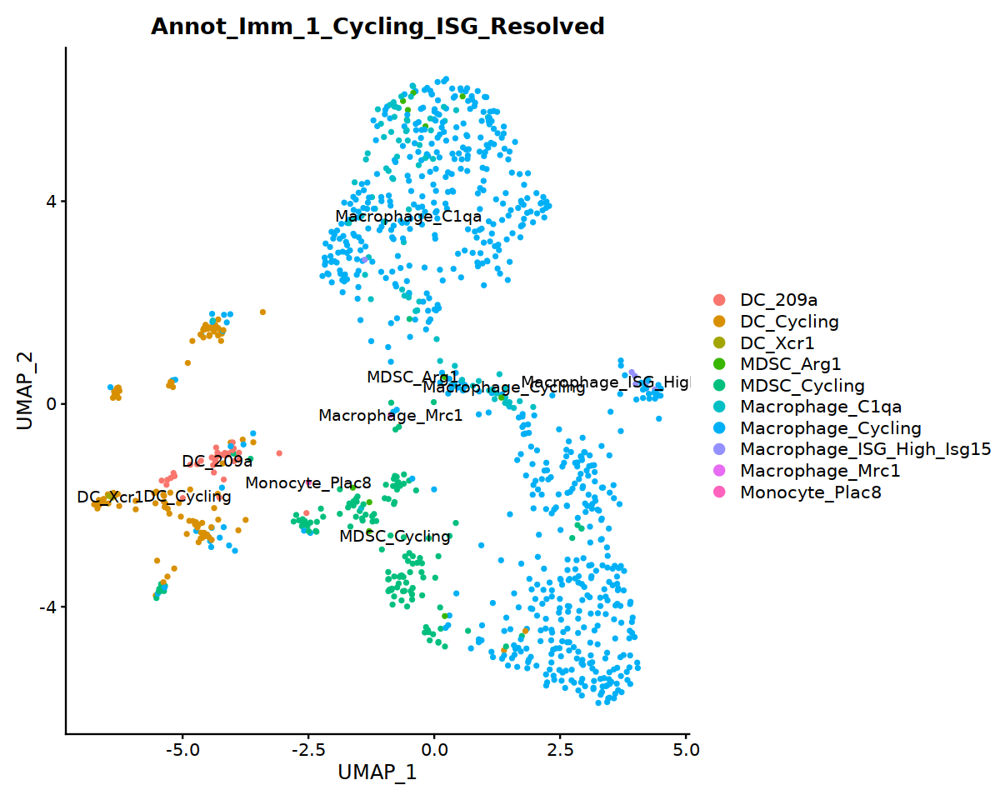

In [85]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(seur_myl_cyc, label = T, group.by="Annot_Imm_1_Cycling_ISG_Resolved")

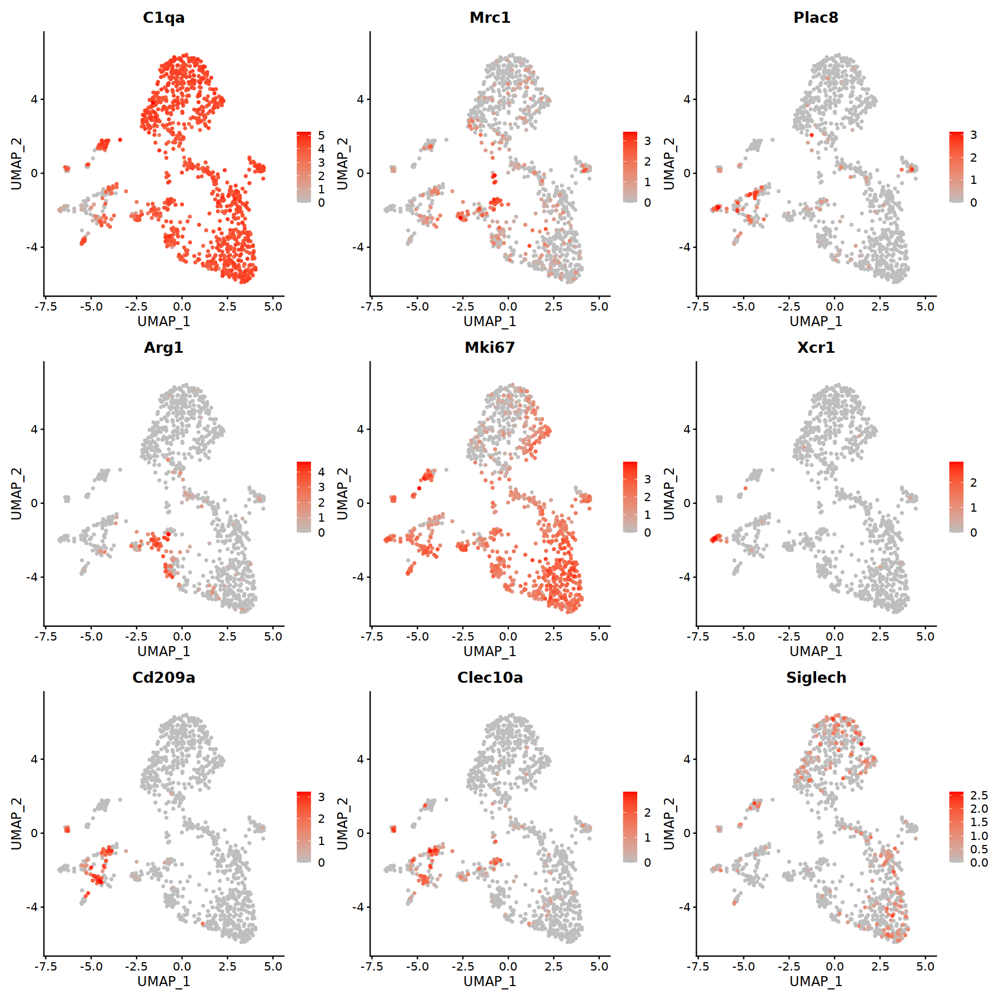

In [86]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_myl_cyc, c("C1qa","Mrc1","Plac8","Arg1","Mki67","Xcr1","Cd209a","Clec10a","Siglech"),order = T,cols = c("grey","red"))


Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



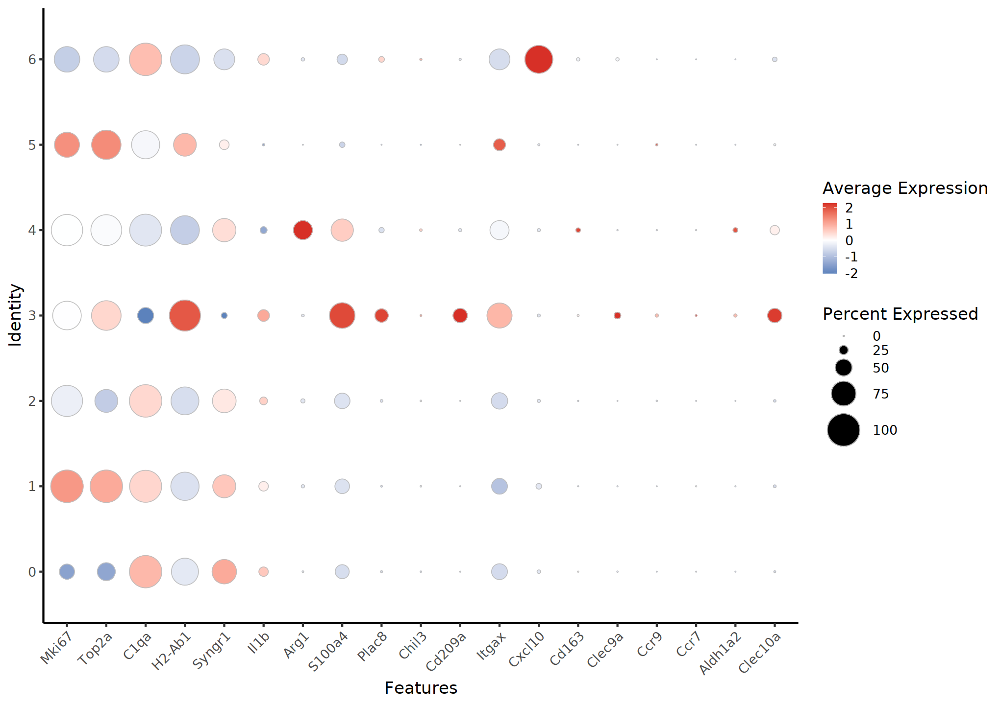

In [87]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_myl_cyc, features = c("Mki67","Top2a","C1qa","H2-Ab1","Syngr1","Il1b","Arg1","S100a4","Plac8","Chil3","Cd209a","Itgax","Cxcl10","Cd163","Clec9a","Ccr9","Ccr7","Aldh1a2","Clec10a"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [88]:
markers_myl_cyc <- FindAllMarkers(seur_myl_cyc, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")
markers_myl_cyc %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1.055861e-60,0.7973490,0.916,0.565,2.520446e-56,0,Mcm6
4.209567e-50,0.7786068,0.945,0.650,1.004866e-45,0,Ccnd1
4.664643e-37,0.7138889,0.966,0.846,1.113497e-32,0,Pmepa1
1.271507e-26,0.7061131,0.901,0.805,3.035214e-22,0,Bin1
5.646043e-17,0.7549630,1.000,0.965,1.347767e-12,0,Lyz2
7.577921e-115,2.1413360,1.000,0.437,1.808925e-110,1,Hist1h1b
6.395611e-111,1.8281688,0.982,0.597,1.526696e-106,1,Hist1h4d
8.914384e-111,1.7167553,0.996,0.571,2.127953e-106,1,Hist1h1e
1.323688e-104,1.7673123,0.973,0.367,3.159775e-100,1,Hist1h2ae


In [89]:
#0 Macrophage_Cycling_Mki67
#1 Macrophage_Cycling_Mki67
#2 Macrophage_Cycling_Mki67
#3 DC_Cycling_Mki67
#4 MDSC_Cycling_Mki67
#5 Unidentified
#6 Macrophage_Cycling_Mki67

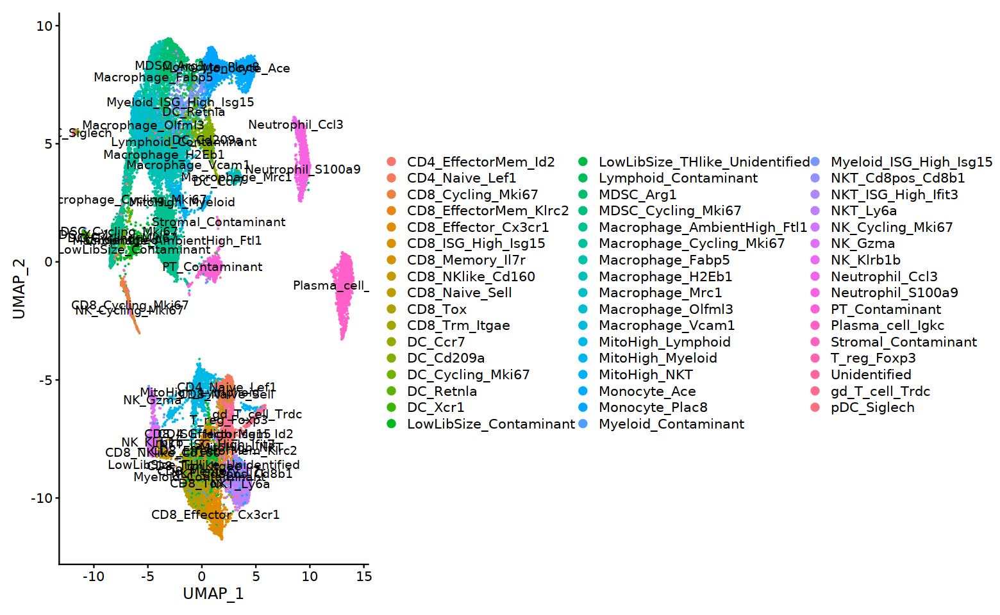

In [90]:
#0 Macrophage_Cycling_Mki67
#1 Macrophage_Cycling_Mki67
#2 Macrophage_Cycling_Mki67
#3 DC_Cycling_Mki67
#4 MDSC_Cycling_Mki67
#5 Unidentified
#6 Macrophage_Cycling_Mki67

seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 0)),value = "Macrophage_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 1)),value = "Macrophage_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 2)),value = "Macrophage_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 3)),value = "DC_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 4)),value = "MDSC_Cycling_Mki67")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 5)),value = "Unidentified")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_cyc@meta.data, seurat_clusters == 6)),value = "Macrophage_Cycling_Mki67")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

Centering and scaling data matrix

PC_ 1 
Positive:  C1qb, C1qc, C1qa, Cd63, Cd81, Hexb, Ms4a7, Apoe, Timp2, Pmepa1 
	   Ctsd, Olfml3, Fcrls, Itgb5, Trem2, Stab1, Cd72, Lgmn, Fth1, Tmem176a 
	   Cd9, Hpgds, Tmem119, Basp1, Syngr1, Bhlhe41, Rnase4, Camk1, Bin1, Dst 
Negative:  Plac8, S100a6, S100a4, Ifitm6, Napsa, Gpr141, Ly6c2, Sell, S100a11, Ahnak 
	   Fgr, Tmsb10, S100a10, Hp, Ms4a4c, Ccr2, Chil3, Ifi205, Emb, Hpse 
	   Zyx, Gda, Ifitm2, Tmpo, Samhd1, Cytip, Ifi209, Trim30c, 4930523C07Rik, Slfn1 
PC_ 2 
Positive:  Tmem176b, Cst3, Tmem176a, Ighm, H2-Eb1, H2-Aa, Hpgd, H2-DMb1, H2-Ab1, mt-Nd4 
	   Lifr, Kctd12, Cd74, mt-Nd3, mt-Cytb, mt-Nd2, Clec4b1, mt-Nd1, Ckb, Ciita 
	   Rnase6, Bmyc, Ramp1, Gng10, Clec4a3, Clec4a2, Lilra5, Fam129a, Mef2c, Batf3 
Negative:  Pgam1, Pkm, Tpi1, Aldoa, Mif, Pgk1, Gapdh, Bnip3, Capg, Ldha 
	   Lgals3, Slc2a1, AA467197, Cstb, Arg1, Hilpda, Adam8, Srgn, Fam162a, Slc16a3 
	   Ero1l, Anxa2, Prdx6, Grina, Hmox1, Fth1, Esd, Il1rn, Ier3, Ninj1 
PC_ 3 
Positive: 

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 480
Number of edges: 16323

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8159
Number of communities: 4
Elapsed time: 0 seconds


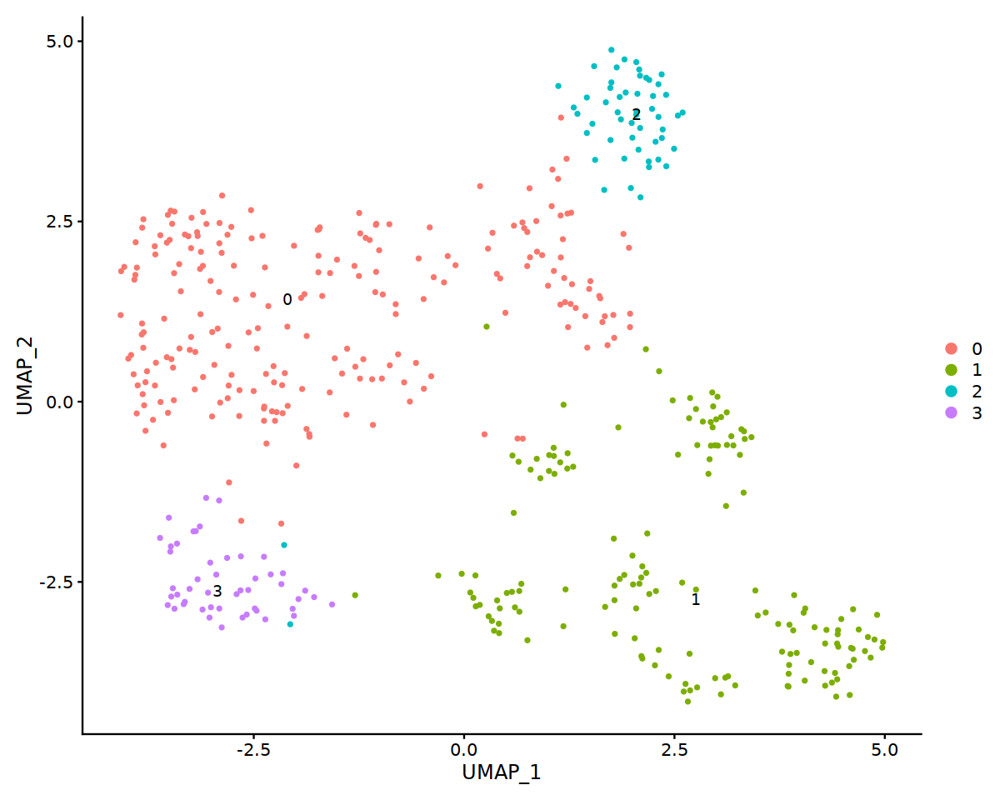

In [91]:
options(repr.plot.width=10, repr.plot.height=8)

seur_myl_isg = subset(seur_myl, idents = 9)
seur_myl_isg <- NormalizeData(seur_myl_isg)
seur_myl_isg <- FindVariableFeatures(seur_myl_isg, selection.method = "vst",nfeatures = 3000)
seur_myl_isg <- ScaleData(seur_myl_isg, features = row.names(seur_myl_isg))
seur_myl_isg <- RunPCA(seur_myl_isg, npcs = 30,verbose = T)
seur_myl_isg <- RunHarmony(seur_myl_isg, group.by.vars = "Sample")
seur_myl_isg <- RunUMAP(seur_myl_isg, reduction = "harmony", dims = 1:20)
seur_myl_isg <- FindNeighbors(seur_myl_isg, reduction = "harmony", dims = 1:20)
seur_myl_isg <- FindClusters(seur_myl_isg, resolution = 0.3)
DimPlot(seur_myl_isg, label = T)

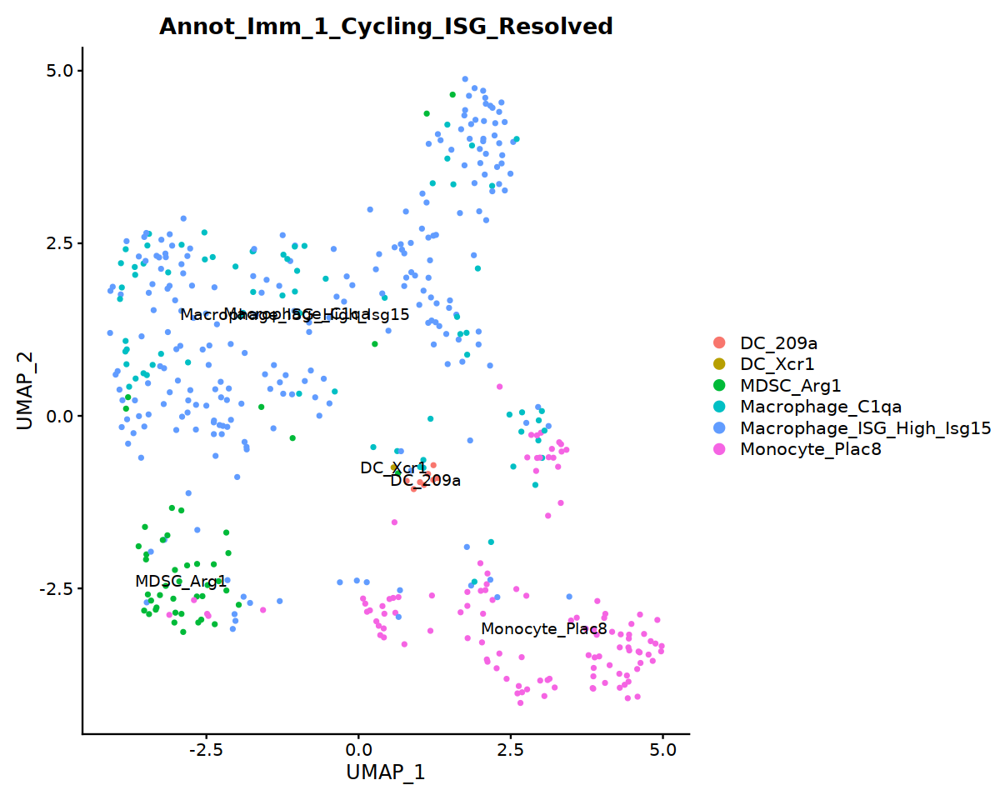

In [92]:
options(repr.plot.width=10, repr.plot.height=8)
DimPlot(seur_myl_isg, label = T, group.by="Annot_Imm_1_Cycling_ISG_Resolved")

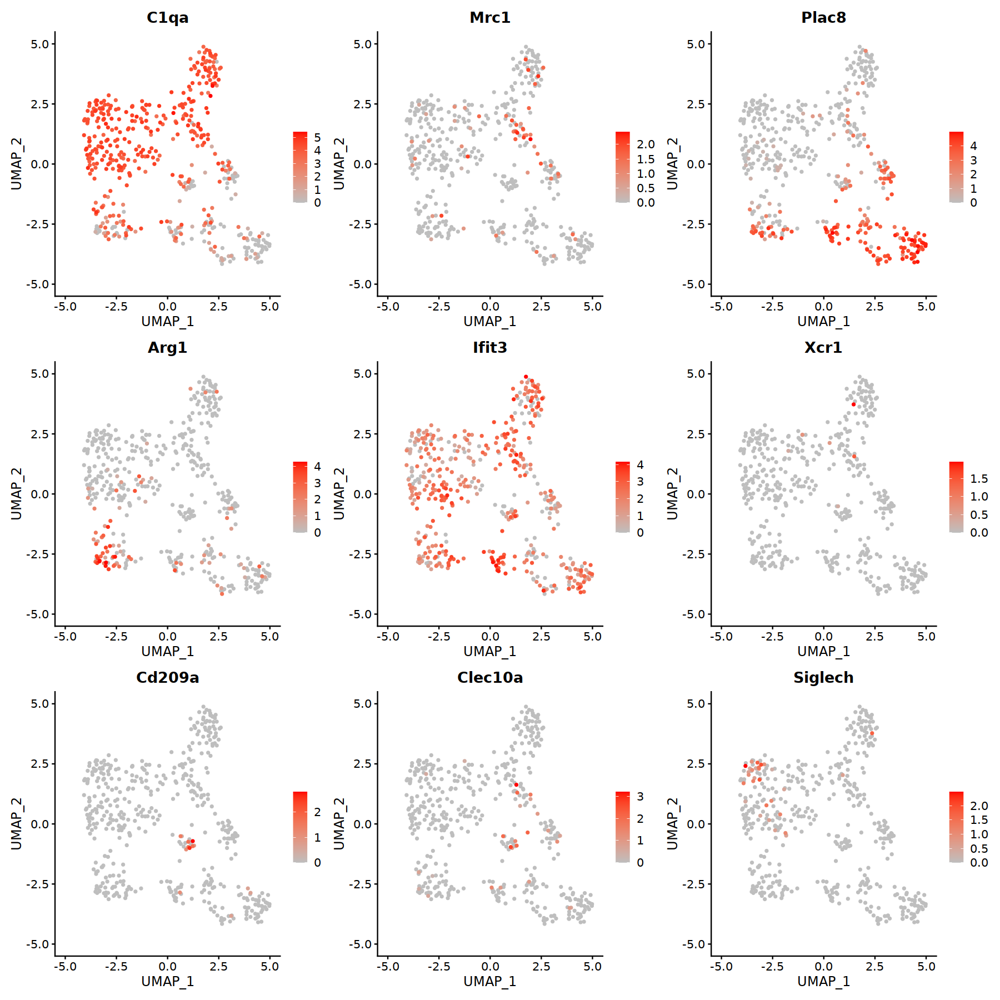

In [93]:
options(repr.plot.width=15, repr.plot.height=15)
FeaturePlot(seur_myl_isg, c("C1qa","Mrc1","Plac8","Arg1","Ifit3","Xcr1","Cd209a","Clec10a","Siglech"),order = T,cols = c("grey","red"))


Warning message:
"Scaling data with a low number of groups may produce misleading results"
Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



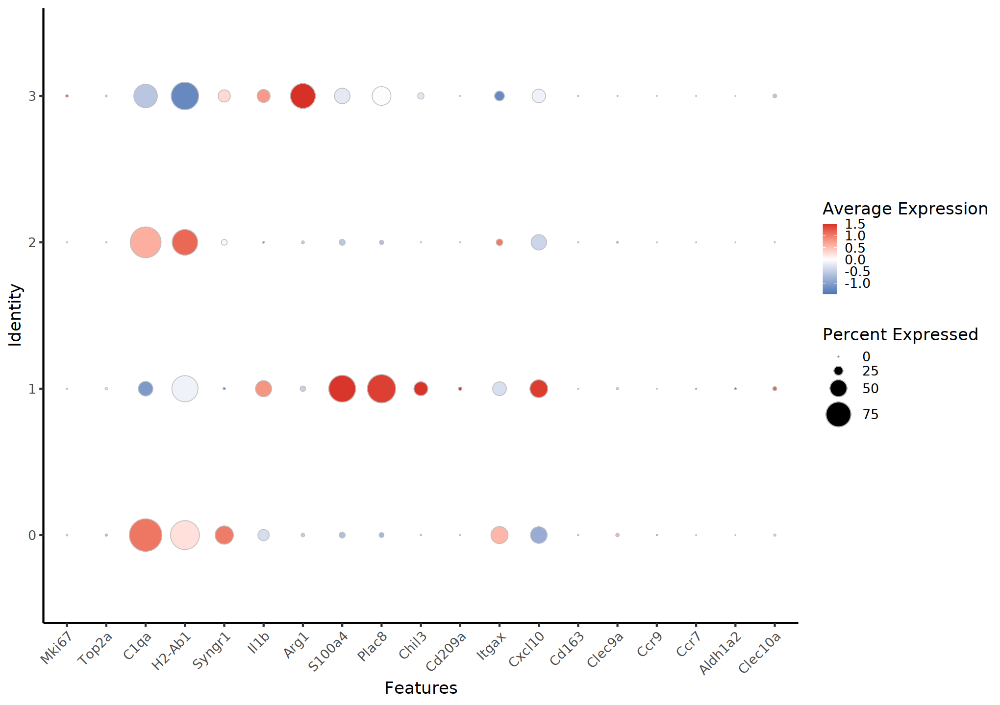

In [94]:
options(repr.plot.width=17, repr.plot.height=12)

DotPlot(seur_myl_isg, features = c("Mki67","Top2a","C1qa","H2-Ab1","Syngr1","Il1b","Arg1","S100a4","Plac8","Chil3","Cd209a","Itgax","Cxcl10","Cd163","Clec9a","Ccr9","Ccr7","Aldh1a2","Clec10a"),assay = "RNA",dot.scale = 18, cols = c("white","red")) + theme_classic(base_size = 20) +
geom_point(aes(size = pct.exp),shape = 21, color = "grey",stroke = 0.5) + 
scale_colour_gradient2(low = "#4575b4", mid = "white", high = "#d73027") +
theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [95]:
markers_myl_isg <- FindAllMarkers(seur_myl_isg, only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25, assay = "RNA",latent.vars = "Sample",test.use = "LR")
markers_myl_isg %>% group_by(cluster) %>% top_n(n = 5, wt = avg_log2FC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.277522e-60,1.6767653,0.996,0.584,5.436674e-56,0,C1qa
2.796601e-60,1.7167716,0.991,0.564,6.675767e-56,0,C1qc
7.031719e-51,1.7640424,0.969,0.432,1.678542e-46,0,Cd81
2.287789e-49,1.6177242,0.991,0.813,5.461181e-45,0,Hexb
6.044174e-48,1.7993381,0.888,0.401,1.442805e-43,0,Pmepa1
1.569191e-60,3.5231716,0.859,0.179,3.745816e-56,1,Plac8
9.323945e-54,2.9990509,0.814,0.194,2.225719e-49,1,S100a4
2.359615e-50,2.3613196,0.917,0.377,5.632638e-46,1,S100a6
1.815466e-42,3.6368739,0.628,0.080,4.333699e-38,1,Ly6c2


In [96]:
#0 Macrophage_ISG_High_Isg15
#1 Monocyte_ISG_High_Isg15
#2 Macrophage_ISG_High_Isg15
#3 MDSC_ISG_High_Isg15

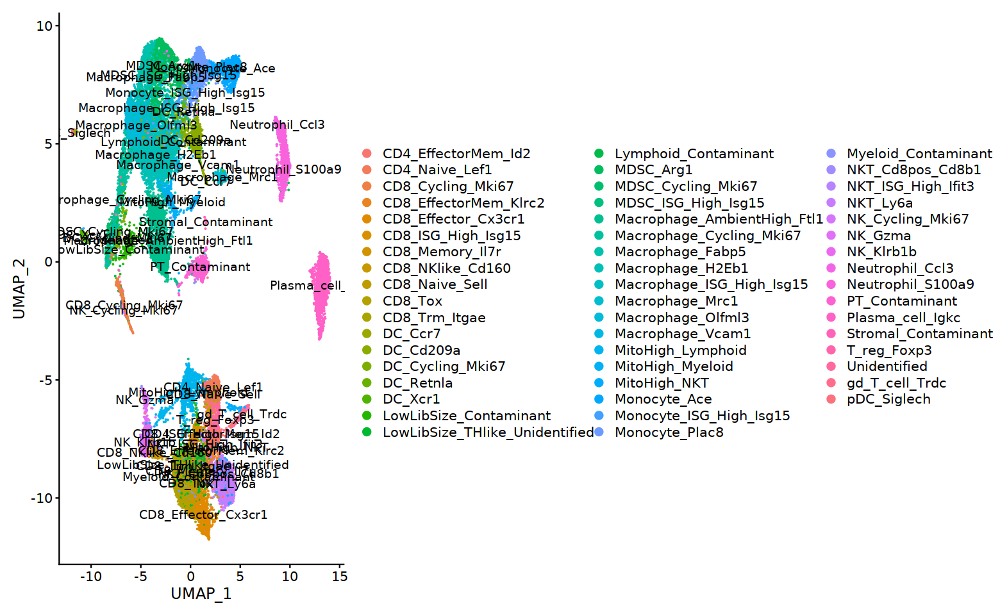

In [97]:
#0 Macrophage_ISG_High_Isg15
#1 Monocyte_ISG_High_Isg15
#2 Macrophage_ISG_High_Isg15
#3 MDSC_ISG_High_Isg15

seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_isg@meta.data, seurat_clusters == 0)),value = "Macrophage_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_isg@meta.data, seurat_clusters == 1)),value = "Monocyte_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_isg@meta.data, seurat_clusters == 2)),value = "Macrophage_ISG_High_Isg15")
seur_i = SetIdent(seur_i, cells = row.names(subset(seur_myl_isg@meta.data, seurat_clusters == 3)),value = "MDSC_ISG_High_Isg15")

Idents(seur_i) = factor(Idents(seur_i), levels = sort(unique(as.character(Idents(seur_i)))) )

options(repr.plot.width=13, repr.plot.height=8)
DimPlot(seur_i, label = T)

In [98]:
seur_i$Annot_Imm_1_Cycling_ISG_Resolved_Granular = Idents(seur_i)

In [99]:
saveRDS(seur_i, file = "Manuscript_Objects/Immune_SeuratObject.RDS")

### Granular immune cell type annotations are complete